# Evaluation

Credits
- [Stable Baselines3](https://github.com/DLR-RM/stable-baselines3)
- [RL Baselines3 Zoo](https://github.com/DLR-RM/rl-baselines3-zoo)
- [Gymnasium](https://gymnasium.farama.org/)
- [rliable](https://github.com/google-research/rliable)

### Import

In [122]:
import os
import json 
import warnings
import itertools
import pickle
from copy import deepcopy
from pathlib import Path
from glob import glob
from typing import Any, Dict, List, Optional, SupportsFloat, Tuple, NamedTuple, Union, Callable
import inflection

import math
import numpy as np
from numpy.random import RandomState, Generator
import pandas as pd
import pytablewriter
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib import rcParams
from scipy.spatial import distance_matrix

import gymnasium as gym

# rliable version: 1.2.0 as of 13 Sep 2024
try:
    from rliable import library as rly
    from rliable import metrics, plot_utils
except ImportError:
    rly = None

### Define configs

In [ ]:
# global theme for plotting
THEME = 'rliable' # recommended
THEME_CHOICES = ['rliable', 'rl_zoo3', 'default']

# text rendering in matplotlib (default is mathtext)
USE_LATEX = True

# evaluation npz log info
# set 'BASE_LOG_PATH' to the '--log-folder' that you set during training 
# if you wish to regenerate the post-processed evaluation results, e.g., post_processed_results_56.pkl
BASE_LOG_PATH = '' # to be set by user
ALGO = 'ppo'
WILDCARD = '**'
EVALUATION_FILE = 'evaluations.npz'
N_EVALUATION_FILE = 1 # per test case (i.e., per game, self-attention type, seed)
N_EVALUATION_CHECKPOINT = 50 # total no. of eval checkpoints
N_EVALUATION_EPISODE = 5 # no. of episodes per eval checkpoint
EVALUATION_TIMESTEP_KEY = 'timesteps'
EVALUATION_RESULT_KEY = 'results'
EVALUATION_EP_LEN_KEY = 'ep_lengths'

# experiment variables
NUM_TIMESTEPS = 1e7 # this is the total timesteps set in the ppo.yml
GAMES = [] # all games with 'NoFrameskip-v4' suffix
GAMES_56 = [] # games focused in this paper
GAMES_EXCLUDED_IN_AGENT57_NO_VERSION = ['Adventure', 'AirRaid', 'Carnival', 'ElevatorAction', 'JourneyEscape', 'Pooyan'] # games excluded by Agent57
GAME_VERSION = 'NoFrameskip-v4'
SELF_ATTN_TYPES = ['NA', 'SWA', 'CWRA', 'CWCA', 'CWRCA']
SEEDS = ['0', '1', '10', '42', '1234']
SEEDS_TO_RUNS = {'0':0, '1':1, '10':2, '42':3, '1234':4} # map seeds to column indices in 'mean_per_eval' array

# post-processed evaluation results in pickle file format
PICKLE_FILE_PATH_56 = 'data/post_processed_results_56.pkl'

# smoothing factors
SMOOTH_WEIGHT = 0.98  # weight used in Debiased Exponential Moving Average (DEMA)

# figures
FIGURE_PATH_EVALUATION = 'figures'
LINEPLOT_PATH = 'lineplot' # learning curves
RLIABLE_PATH = 'rliable' # overall performance with stratified bootstrap CIs
DEMA_PATH = 'debiased_ema'
UNSMOOTH_PATH = 'unsmoothed'
FIGURE_EXT = '.pdf'
DPI = 300

# tables
TABLE_PATH_EVALUATION = 'tables'
TABLE_MARKDOWN_EXT = '.md' # for results table in markdown format
TABLE_LATEX_EXT = '.txt' # for results table in latex format

# winners
WINNER_PATH_EVALUATION = 'winners'
WINNER_EXT = '.json' # for winning games

In [127]:
# get all Atari games with version 'NoFrameskip-v4'
atari_game_list=[]
for key, value in gym.envs.registry.items():
    if 'NoFrameskip-v4' in key and '-ram' not in key and 'AtariEnv' in value.entry_point: 
        atari_game_list.append(key)

In [128]:
# set GAMES
GAMES = atari_game_list.copy()

In [131]:
# add game version to each game in GAMES_EXCLUDED_IN_AGENT57_NO_VERSION
GAMES_EXCLUDED_IN_AGENT57 = [game+GAME_VERSION for game in GAMES_EXCLUDED_IN_AGENT57_NO_VERSION]

In [134]:
# set GAMES_56
GAMES_56 = [game for game in GAMES if game not in GAMES_EXCLUDED_IN_AGENT57]

### Set theme for all the plots

In [150]:
def set_theme(theme):
    """
    set visual theme for all plots

    :param str theme: the theme/style for plotting, default value is defined in 'THEME', all the supported themes are defined in 'THEME_CHOICES'
    """
    if theme not in THEME_CHOICES:
        raise ValueError(f"Theme '{theme}' is not recognized. Please check the `THEME_CHOICES` for supported themes.")
    elif theme == 'rliable':
        # seaborn style
        sns.set_style("white")
        # matplotlib runtime configuration
        rcParams['figure.max_open_warning'] = 0 # disable max_open_warning
        rcParams['legend.loc'] = 'best'
        rcParams['pdf.fonttype'] = 42
        rcParams['ps.fonttype'] = 42
        rcParams['text.usetex'] = False # use mathtext
    elif theme == 'rl_zoo3':
        # seaborn style
        sns.set_theme() # This function changes the global defaults for all plots using the matplotlib rcParams system. 
        sns.set_style("whitegrid")
        # matplotlib runtime configuration
        if USE_LATEX:
            rcParams['text.usetex'] = True
    elif theme == 'default':
        sns.set_theme() # seaborn default theme
    else:
        warnings.warn(f"Set theme failed because the theme '{theme}' is not defined yet.")
        return
    print(f"Theme is set to '{theme}' style.")   

In [151]:
set_theme(THEME)

Theme is set to 'rliable' style.


### Utilities for file handling & data loading

#### evaluations.npz file handling 

In [155]:
def get_all_evaluation_files(game: str, sat: str, seed: str, recursive: bool=True) -> List[str]:
    """
    get all the evaluations.npz files for the given test case as specified by the game, self-attention type and seed
    note: there should be only one evaluations.npz file per test case

    :param game: Atari game name (e.g., 'AlienNoFrameskip-v4')
    :param sat: self-attention type (e.g., 'NA')
    :param seed: seed as a string (e.g., '0')
    :param recursive: enable recursive search of subfloders, default True
    :return: the list of matched evaluations.npz file paths (these are the absolute paths because the BASE_LOG_PATH is absolute)
    :rtype: list
    """
    # auto construct the log path based on the given experiment variables
    # take note of the implicit precedence in this function: game > sat > seed (due to the return statement) 
    # i.e., when game = None, it does not matter whether sat or seed is none or not.
    # check user inputs
    assert game in GAMES or game is None, f"game {game} is not recognized! Please check the supported games in 'GAMES'."
    assert sat in SELF_ATTN_TYPES or sat is None, f"sat {sat} is not recognized! Please check the supported sats in 'SELF_ATTN_TYPES'."
    assert seed in SEEDS or seed is None, f"seed {seed} is not recognized! Please check the supported seeds in 'SEEDS'."
    
    if game is None:
        game = WILDCARD
        log_path = os.path.join(BASE_LOG_PATH, game, EVALUATION_FILE)
        return glob(log_path, recursive=recursive)
    elif sat is None:
        sat = WILDCARD
        log_path = os.path.join(BASE_LOG_PATH, game, sat, EVALUATION_FILE)
        return glob(log_path, recursive=recursive)
    elif seed is None:
        seed = WILDCARD
        log_path = os.path.join(BASE_LOG_PATH, game, sat, seed, EVALUATION_FILE)
        return glob(log_path, recursive=recursive)
    else:
        log_path = os.path.join(BASE_LOG_PATH, game, sat, seed, ALGO, WILDCARD, EVALUATION_FILE)
        
    return glob(log_path, recursive=recursive)  

In [163]:
def load_all_evaluation_files(game_list: List[str], sat_list: List[str], seed_list: List[str], recursive: bool=True, \
                              max_timesteps: float=1e7, min_timesteps: float=-1, no_million: bool=False, \
                              median: bool=False, learning_curves: bool=False, results_table: bool=False, verbose: bool=False, \
                              save_file: bool=False, output_fp: str=None) -> Dict[Any, Any]:
    """
    load and process all the evaluations.npz files and save them into a dict and optionally save it as a pickle file.
    aliases of keys in evaluations.npz file  
        EVALUATION_TIMESTEP_KEY = 'timesteps'
        EVALUATION_RESULT_KEY = 'results'
        EVALUATION_EP_LEN_KEY = 'ep_lengths'

    :param game_list: the list of Atari games
    :param sat_list: the list of self-attention types
    :param seed_list: the list of seeds
    :param recursive: enable recursive search of subfloders, default True
    :param max_timesteps: max number of timesteps to display, default as 10M, i.e., 1e7
    :param min_timesteps: min number of timesteps to keep a trial/run/seed, default as -1
    :param no_million: do not convert x-axis to million, default false
    :param median: display median instead of mean in the results table, default false
    :param learning_curves: plot learning curves, default false
    :param results_table: generate and render the results table in Markdown format, default false
    :param verbose: print the details of each evaluations.npz file, default false
    :param save_file: save the post-processed results as a pickle file, default false
    :param output_fp: the path where the pickle file will be saved, this contains the pickle filename as well
    :return: the post-processed results in the dict format
    :rtype: dict
    """
    assert game_list is not None and sat_list is not None and seed_list is not None, 'game, self-attention type, and seed lists must not be None!'
    assert len(game_list) != 0 and len(sat_list) != 0 and len(seed_list) != 0, 'game, self-attention type, and seed lists must not be empty!'

    if results_table:
        results = {} # record last_evals statistics (used for constructing the results table)
    post_processed_results = {} # record post-processed results for rliable plots and etc (to be saved as a pickle file)

    for game in game_list:
        if learning_curves:
            # if plotting learning curves, create a new figure for each game
            plt.figure(f"Results {game}")
            plt.title(f"{game.replace(GAME_VERSION, '')}", fontsize=14)
            x_label_suffix = "" if no_million else "(in Million)"
            plt.xlabel(f"Timesteps {x_label_suffix}", fontsize=14)
            plt.ylabel("Score", fontsize=14)
        if results_table:
            results[game] = {}
        post_processed_results[game] = {}
        
        for sat in sat_list:
            # collect all the evaluations.npz files for the current game and sat based on the given seed_list
            # take note that we have validated that each test case has only one evaluations.npz file
            eval_file_paths = get_all_evaluation_files(game, sat, seed=None) if seed_list == SEEDS else [get_all_evaluation_files(game, sat, seed)[0] for seed in seed_list]
            assert len(eval_file_paths) == len(seed_list), f"the number of evaluations.npz files should be {len(seed_list)}, but there are {len(eval_file_paths)}!"
            if verbose:
                print(f"found {len(eval_file_paths)} evaluations.npz files for game '{game}', sat '{sat}'.")
            # create containers for merging the evaluation results over seeds
            max_len = 0 # display control parameter (max n_eval)
            timesteps = np.empty(0) # display control parameter (the final set of evaluation checkpoints)
            merged_timesteps, merged_results = [], [] # keep original 'timesteps' log and 'results' log from each evaluations.npz
            last_eval = [] # keep the last evaluation scores of shape (n_eval_episodes,) from each evaluations.npz (to be used for most of the rliable plots)
            
            for eval_file_path in eval_file_paths:
                # try to load the evaluations.npz file 
                # note: we have observed that the file paths found by glob have seeds in the same order as defined in SEEDS
                # therefore, the n_runs is in the same order as SEEDS, i.e., 1st run -> seed=0, 5th run -> seed=1234
                try:
                    log = np.load(eval_file_path)
                    if verbose:
                        print(f"eval_file_path: {eval_file_path}")
                        for fn, arr in log.items():
                            print(f"filename: {fn}, array shape: {arr.shape}")
                        print(f"n_eval: {len(log[EVALUATION_TIMESTEP_KEY])}")
                        print(f"n_eval_episodes: {log[EVALUATION_RESULT_KEY].shape[-1]}")
                        print(f"max_timesteps: {log[EVALUATION_TIMESTEP_KEY][-1]}")
                        print(f"min_timesteps: {log[EVALUATION_TIMESTEP_KEY][0]}")
                        print(f"max_episode_reward: {np.max(log[EVALUATION_RESULT_KEY])}")
                        print(f"min_episode_reward: {np.min(log[EVALUATION_RESULT_KEY])}")
                        print(f"max_episode_length: {np.max(log[EVALUATION_EP_LEN_KEY])}")
                        print(f"min_episode_length: {np.min(log[EVALUATION_EP_LEN_KEY])}")
                except FileNotFoundError:
                    print("evaluations.npz file not found in", eval_file_path)
                    continue
                
                # recursively update 'timesteps' and 'max_len' based on all the evaluations.npz files in eval_file_paths
                # log["results"] is of shape (n_eval, n_eval_episodes)
                # mean_ is of shape (n_eval,)
                mean_ = np.squeeze(log[EVALUATION_RESULT_KEY].mean(axis=1))
                if mean_.shape == ():
                    warnings.warn(f"{eval_file_path} is skipped because 'mean_' is of shape {mean_.shape}, i.e., 'n_eval' = 1.")
                    continue
                # update max_len across all evaluations.npz files in the current eval_file_paths
                # max_len is the maximum n_eval
                max_len = max(max_len, len(mean_))
                # update timesteps across all evaluations.npz files in the current eval_file_paths
                if len(log[EVALUATION_TIMESTEP_KEY]) >= max_len:
                    timesteps = log[EVALUATION_TIMESTEP_KEY]
                # update 'timesteps' and 'max_len' based on the parameter 'max_timesteps'
                while timesteps[max_len - 1] > max_timesteps:
                    max_len -= 1
                timesteps = timesteps[:max_len]

                # fill up all the containers: merged_timesteps, merged_results, and last_eval for post-processing
                # get the original timesteps of shape (n_eval,) and append it to merged_timesteps
                # merged_timesteps is of shape (n_runs, n_eval)
                merged_timesteps.append(log[EVALUATION_TIMESTEP_KEY])
                # get the original results of shape (n_eval, n_eval_episodes) and append it to merged_results
                # merged_results is of shape (n_runs, n_eval, n_eval_episodes)
                merged_results.append(log[EVALUATION_RESULT_KEY])
                # get the last evaluation scores of shape (n_eval_episodes,) and append it to last_eval
                # last_eval is of shape (n_runs, n_eval_episodes) once converted into a numpy array
                if len(log[EVALUATION_RESULT_KEY]) >= max_len:
                    last_eval.append(log[EVALUATION_RESULT_KEY][max_len - 1])
                else:
                    last_eval.append(log[EVALUATION_RESULT_KEY][-1])
            
            # update 'timesteps', 'max_len', and 'min_' based on the parameter 'min_timesteps'
            if min_timesteps > 0:
                min_ = np.inf # this is the positive inf
                for n_timesteps in merged_timesteps:
                    if n_timesteps[-1] >= min_timesteps:
                        min_ = min(min_, len(n_timesteps)) # min_ is the minimum n_eval (it is not the same as min_timesteps)
                        if len(n_timesteps) == min_:
                            max_len = len(n_timesteps) # update max_len with the consideration of min_timesteps
                            while n_timesteps[max_len - 1] > max_timesteps:
                                max_len -= 1
                            timesteps = n_timesteps[:max_len]
                
                # downsampling if n_eval differs across the evaluations.npz files
                # downsampling is only performed if we found n_eval > min_ and n_timesteps[-1] >= min_timesteps
                merged_results_ = deepcopy(merged_results) # create a copy to avoid overwriting the original merged_results
                for trial_idx, n_timesteps in enumerate(merged_timesteps):
                    if len(n_timesteps) == min_ or n_timesteps[-1] < min_timesteps:
                        pass
                    else:
                        warnings.warn(f"Downsampling for trial {trial_idx} with {len(n_timesteps)} evaluations and max evaluation checkpoint={n_timesteps[-1]}.")
                        new_merged_results = []
                        distance_mat = distance_matrix(n_timesteps.reshape(-1, 1), timesteps.reshape(-1, 1))
                        closest_indices = distance_mat.argmin(axis=0)
                        for closest_idx in closest_indices:
                            new_merged_results.append(merged_results_[trial_idx][closest_idx])
                        # update the original merged_results and last_eval containers 
                        merged_results[trial_idx] = new_merged_results
                        last_eval[trial_idx] = merged_results_[trial_idx][closest_indices[-1]]
            
            # remove incomplete runs, i.e., runs with n_eval < max_len
            # note that, the max_len here is updated w.r.t both max_timesteps and min_timesteps
            merged_results_tmp, last_eval_tmp = [], []
            for idx in range(len(merged_results)):
                if len(merged_results[idx]) >= max_len:
                    merged_results_tmp.append(merged_results[idx][:max_len])
                    last_eval_tmp.append(last_eval[idx])
            merged_results = merged_results_tmp
            last_eval = last_eval_tmp
            if verbose:
                print(f"the final 'max_len' selected for {game}, {sat}: {max_len}")
                print(f"the final 'n_trials' or 'n_runs' selected for {game}, {sat}: {len(merged_results)}")
                print(f"the final shape of each 'log['results']' for {game}, {sat}: {merged_results[0].shape}")
            
            # post-process merged_results and last_eval and compute statistics
            if len(merged_results) > 0:
                # convert merged_results to a numpy array
                merged_results = np.array(merged_results)
                n_runs = len(merged_results)
                n_eval = len(timesteps)
                # reshape merged_results for plotting learning curves (mean and std_err per evaluation)
                evaluations = merged_results.reshape((n_runs, n_eval, -1)) # shape: (n_runs, n_eval, n_eval_episodes)
                evaluations = np.swapaxes(evaluations, 0, 1) # shape: (n_eval, n_runs, n_eval_episodes)
                mean_ = np.mean(evaluations, axis=(1, 2)) # shape: (n_eval,)
                mean_per_eval = np.mean(evaluations, axis=-1) # to be transposed for rliable plot later, shape: (n_eval, n_runs)
                std_ = np.std(mean_per_eval, axis=-1) # standard deviation of sample means, shape: (n_eval,)
                std_error = std_ / np.sqrt(n_runs) # standard error of sample means, shape: (n_eval,)
                last_evals = np.array(last_eval).squeeze().mean(axis=-1) # these are the balls per bucket in stratified bootstrapping, shape: (n_runs,)
                std_last_eval = np.std(last_evals) # standard deviation of last_evals, shape: (), a scalar
                std_error_last_eval = std_last_eval / np.sqrt(n_runs) # standard error of last_evals (for results table), shape: (), a scalar
                if verbose:
                    print(f"Summary for game={game}, sat={sat}")
                    print("**********************")
                    print(f"shape of the 'merged_results': {merged_results.shape}") # (n_runs, n_eval, n_eval_episodes)
                    print(f"'n_runs': {n_runs}")
                    print(f"'n_eval': {n_eval}")
                    print(f"shape of the 'evaluations': {evaluations.shape}") # (n_eval, n_runs, n_eval_episodes)
                    print(f"'mean_': {mean_}") # (n_eval,)
                    print(f"shape of the 'mean_per_eval': {mean_per_eval.shape}") # (n_eval, n_runs)
                    print(f"'std_': {std_}") # (n_eval,)
                    print(f"'std_error': {std_error}") # (n_eval,)
                    print(f"'last_evals': {last_evals}") # (n_runs,)
                    print(f"'std_last_eval': {std_last_eval}") # (1,)
                    print(f"'std_error_last_eval': {std_error_last_eval}") # (1,)

                # generate results table (this depicts the last_evals statistics)
                if results_table:
                    if median:
                        results[game][sat] = f"{np.median(last_evals):.2f}"
                    else:
                        results[game][sat] = f"{np.mean(last_evals):.2f} +/- {std_error_last_eval:.2f}"

                # re-scale x-axis based on the config no_million
                divider = 1e6 # 1 million
                if no_million:
                    divider = 1.0

                # save the summary info to post_processed_results container
                post_processed_results[game][sat] = {
                    "timesteps": timesteps, # shape: (n_eval,)
                    "mean": mean_, # shape: (n_eval,)
                    "std_error": std_error, # shape: (n_eval,)
                    "last_evals": last_evals, # shape: (n_runs,)
                    "std_error_last_eval": std_error_last_eval, # shape: ()
                    "mean_per_eval": mean_per_eval, # shape: (n_eval, n_runs), and n_runs corresponds to SEEDS
                }

                # plot learning curves
                if learning_curves:
                    plt.plot(timesteps / divider, mean_, label=f"{sat}", linewidth=3)
                    plt.fill_between(timesteps / divider, mean_ + std_error, mean_ - std_error, alpha=0.5)

        if learning_curves:
            plt.legend() # place the legend per game figure

    # generate results table and render it in Markdown format
    if results_table:
        writer = pytablewriter.MarkdownTableWriter(max_precision=3)
        writer.table_name = "results_table"
        value_matrix = [[] for i in range(len(game_list))]
        headers = ["Game"]
        for sat in sat_list:
            headers.append(sat)
        writer.headers = headers # headers look like ['Games','NA', 'SWA', 'CWRA', 'CWCA', 'CWRCA']
        for i, game in enumerate(game_list):
            value_matrix[i].append(game.replace(GAME_VERSION, ''))
            # possibly to get the sat with the best performance in terms of mean and bold the text
            for sat in sat_list:
                value_matrix[i].append(f'{results[game].get(sat, "0.0 +/- 0.0")}')
        writer.value_matrix = value_matrix
        writer.write_table()
        # save the results table to the post_processed_results container
        post_processed_results["results_table"] = {"headers": headers, "value_matrix": value_matrix}

    # save the post processed results dict as a pickle file
    if save_file and output_fp is not None:
        if not output_fp.endswith(".pkl"):
            output_fp += ".pkl"
        print(f"saving post-processed results to {output_fp}")
        with open(output_fp, "wb") as file_handler:
            pickle.dump(post_processed_results, file_handler)

    return post_processed_results   

To regenerate the evaluation results, i.e., the `post_processed_results_56.pkl` file, you may uncomment and execute the cell below.

In [ ]:
# game_list = GAMES_56.copy()
# sat_list = SELF_ATTN_TYPES.copy()
# seed_list = SEEDS.copy()
# learning_curves = False # set to True to see all learning curves
# results_table = False # set to True to see the results table
# verbose = False # Set to True to see more logs
# save_file = True
# output_fp = PICKLE_FILE_PATH_56

# post_processed_results_56 = load_all_evaluation_files(game_list, sat_list, seed_list, \
#                                                       learning_curves=learning_curves, results_table=results_table, verbose=verbose, \
#                                                       save_file=save_file, output_fp=output_fp)

To load the evaluation results, i.e., the `post_processed_results_56.pkl` file

In [ ]:
with open(PICKLE_FILE_PATH_56, 'rb') as f:
    post_processed_results_56 = pickle.load(f)

### Utilities for plotting results table

In [189]:
def get_results_table(results: dict, use_last: bool=False, markdown: bool=False, latex: bool=True, \
                      save_table_as_md: bool=False, save_table_as_txt: bool=True, save_winner_as_json: bool=True) -> Tuple[pd.DataFrame, dict, dict]:
    """
    get the table of results based on the post-processed evaluation files as a pandas DataFrame
    bold the results of the "best" algorithm/sat
    count the number of winning games per algorithm/sat
    collect all winning games per algorithm/sat
    optionally write the table of results in Markdown or LaTeX format

    :param results: the post-processed evaluation files in dict format
    :param use_last: use the last evaluation scores for mean and std error calculation, otherwise, use all evaluation scores
    :param markdown: create and write the results table in Markdown format (note that markdown and latex cannot both be True)
    :param latex: create and write the results table in LaTeX format (note that markdown and latex cannot both be True)
    :param save_table_as_md: save the Markdown table as a .md file
    :param save_table_as_txt: save the LaTeX table as a .txt file
    :param save_winner_as_json: save the winning games as a .json file
    :return: the table of results as a pandas DataFrame and a dict as well as the winning games per algorithm
    :rtype: pd.DataFrame, dict, dict
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert not (markdown and latex), f"'markdown' and 'latex' cannot both be True!"
    assert not (save_table_as_md and save_table_as_txt), f"'save_table_as_md' and 'save_table_as_txt' cannot both be True!"
    
    # get table header
    game_list = list(results_.keys())
    n_games = len(game_list)
    sat_list = list(results_[next(iter(results_.keys()))].keys())
    headers = ['Game'] + sat_list
    # initialize table content
    value_matrix = [[] for i in range(len(game_list))]
    # initialize results_table_markdown
    results_table_markdown = {}
    # initialize winning_games container
    winning_games = {}
    # fill the table content
    for i, game in enumerate(game_list):
        # remove the game version for better visual
        game_no_version = game.replace(GAME_VERSION, '')
        if game_no_version in GAMES_EXCLUDED_IN_AGENT57_NO_VERSION:
            # for games that are excluded in Agent57, we append an asterisk to mark them
            value_matrix[i].append(game_no_version+'*')
        else:
            value_matrix[i].append(game_no_version)
        # compute mean and std_err based on score types (last or all)
        if use_last:
            # use the 'last_evals' for mean and std_err calculation
            # get the mean of last_evals for all sat, each last_evals is of shape (n_runs,)
            mean_last_evals_all = [np.mean(results_[game][sat]['last_evals']) for sat in sat_list]
            # get the max mean_last_evals
            max_mean_last_evals = max(mean_last_evals_all)
            # get the index of the max mean_last_evals
            max_mean_last_evals_index = mean_last_evals_all.index(max_mean_last_evals)
            # get the std_error_last_eval for all sat
            std_error_last_eval_all = [results_[game][sat]['std_error_last_eval'] for sat in sat_list]
            if markdown:
                # print("Writing table in Markdown format using last evals...")
                for j in range(len(sat_list)):
                    if j == max_mean_last_evals_index:
                        value_matrix[i].append(f"**{mean_last_evals_all[j]:.2f} ± {std_error_last_eval_all[j]:.2f}**")
                    else:
                        value_matrix[i].append(f"{mean_last_evals_all[j]:.2f} ± {std_error_last_eval_all[j]:.2f}")
            elif latex:
                # print("Writing table in LaTeX format using last evals...")
                for j in range(len(sat_list)):
                    if j == max_mean_last_evals_index:
                        value_matrix[i].append('\textbf{' + f"{mean_last_evals_all[j]:.2f}" + ' $\pm$ ' + f"{std_error_last_eval_all[j]:.2f}" + '}')
                    else:
                        value_matrix[i].append(f"{mean_last_evals_all[j]:.2f}" + ' $\pm$ ' + f"{std_error_last_eval_all[j]:.2f}")
            else:
                raise ValueError("Only 'Markdown' and 'LaTeX' are supported!")
        else:
            # use all_evals for mean and std_err calculation, we need to compute all_evals first (apply mean along n_eval on mean_per_eval)
            # get all_evals for all sat, each all_evals is of shape (n_runs,)
            all_evals_all = [np.mean(results_[game][sat]['mean_per_eval'], axis=0) for sat in sat_list]
            # get the mean of all_evals for all sat
            mean_all_evals_all = [np.mean(all_evals) for all_evals in all_evals_all]
            # get the max mean_all_evals
            max_mean_all_evals = max(mean_all_evals_all)
            # get the index of the max mean_all_evals
            max_mean_all_evals_index = mean_all_evals_all.index(max_mean_all_evals)
            # get the std_error_all_eval for all sat
            std_error_all_eval_all = [np.std(all_evals)/np.sqrt(len(SEEDS)) for all_evals in all_evals_all]
            if markdown:
                # print("Writing table in Markdown format using all evals...")
                for j in range(len(sat_list)):
                    if j == max_mean_all_evals_index:
                        value_matrix[i].append(f"**{mean_all_evals_all[j]:.2f} ± {std_error_all_eval_all[j]:.2f}**")
                    else:
                        value_matrix[i].append(f"{mean_all_evals_all[j]:.2f} ± {std_error_all_eval_all[j]:.2f}")
            elif latex:
                # print("Writing table in LaTeX format using all evals...")
                for j in range(len(sat_list)):
                    if j == max_mean_all_evals_index:
                        value_matrix[i].append('\textbf{' + f"{mean_all_evals_all[j]:.2f}" + ' $\pm$ ' + f"{std_error_all_eval_all[j]:.2f}" + '}')
                    else:
                        value_matrix[i].append(f"{mean_all_evals_all[j]:.2f}" + ' $\pm$ ' + f"{std_error_all_eval_all[j]:.2f}")
            else:
                raise ValueError("Only 'Markdown' and 'LaTeX' are supported!")

    # construct the results table as a DataFrame
    results_table_df = pd.DataFrame(value_matrix,columns=headers)
    if results_table_df.empty:
        raise ValueError(f"'results_table_df' can not be empty!")
    
    # add count of winning games as well as to collect the winning games per sat
    winning_game_pattern = "\*\*.*\*\*" if markdown else "\\textbf.*" # regex pattern for finding the winning game
    count_winning_games_row = ["**No. of wins**"] if markdown else ["\textbf{No. of wins}"] # to be appended to the table
    count_winning_games = [] # for checking the sum against the total no. of games
    for sat in sat_list:
        winning_games_sat_series = results_table_df[sat].str.count(winning_game_pattern)
        winning_games_sat_indices = winning_games_sat_series[winning_games_sat_series == 1].index
        winning_games_sat_list = results_table_df['Game'].iloc[winning_games_sat_indices].tolist()
        winning_games[sat] = winning_games_sat_list
        count_winning_games_sat = winning_games_sat_series.sum()
        count_winning_games_row.append(count_winning_games_sat)
        count_winning_games.append(count_winning_games_sat)
    assert sum(count_winning_games) == len(game_list), f"the total no. of winning games should be the same as the total no. of games!"
    assert sum([len(winning_games[sat]) for sat in sat_list]) == len(game_list), f"the total no. of winning games should be the same as the total no. of games!"
    if save_winner_as_json:
        winner_fp = WINNER_PATH_EVALUATION
        winner_name = f"winners {n_games} games (use last evals)" if use_last else f"winners {n_games} games (use all evals)"
        winner_fn = winner_name + WINNER_EXT
        with open(os.path.join(winner_fp, winner_fn), "w") as fd:
            json.dump(winning_games, fd)
            
    # add the count_winning_row to DataFrame and value_matrix
    count_winning_games_df = pd.DataFrame([count_winning_games_row], columns=headers)
    results_table_df = pd.concat([results_table_df, count_winning_games_df], axis=0)
    value_matrix.append(count_winning_games_row)
    
    # outside the outermost for-loop
    if markdown:
        # create and write the markdown table to console
        writer = pytablewriter.MarkdownTableWriter(max_precision=2)
        writer.table_name = f"results_table {n_games} games (use last evals)" if use_last else f"results_table {n_games} games (use all evals)"
        writer.headers = headers
        writer.value_matrix = value_matrix
        writer.write_table() # write the table to the stream with Markdown table format
        results_table_markdown = {"headers": headers, "value_matrix": value_matrix}
        if save_table_as_md:
            table_fp = TABLE_PATH_EVALUATION
            table_fn = writer.table_name + TABLE_MARKDOWN_EXT
            writer.dump(os.path.join(table_fp, table_fn))
    
    if latex and save_table_as_txt:
        table_name = f"results_table {n_games} games (use last evals)" if use_last else f"results_table {n_games} games (use all evals)"
        table_fp = TABLE_PATH_EVALUATION
        table_fn = table_name + TABLE_LATEX_EXT
        with open(os.path.join(table_fp, table_fn), 'w') as f:
            results_table_df.to_latex(buf=f, header=True, index=False, float_format="{:.2f}".format, escape=False)
        
    return results_table_df, results_table_markdown, winning_games

Get results table using the **all evaluation scores**, i.e., `use_last=False` in Markdown format

In [219]:
results_table_df_56_all, results_table_markdown_56_all, winning_games_56_all = get_results_table(post_processed_results_56, use_last=False, \
                                                                                                 markdown=True, latex=False, save_table_as_md=True, \
                                                                                                 save_table_as_txt=False, save_winner_as_json=True)

# results_table 56 games (use all evals)
|      Game      |          NA           |         SWA         |        CWRA        |         CWCA          |         CWRCA         |
|----------------|-----------------------|---------------------|--------------------|-----------------------|-----------------------|
|Alien           |713.25 ± 23.93         |783.05 ± 33.57       |**820.38 ± 55.90**  |796.17 ± 25.60         |761.62 ± 27.09         |
|Amidar          |233.81 ± 17.10         |194.72 ± 7.87        |249.74 ± 18.04      |219.80 ± 19.40         |**258.99 ± 24.00**     |
|Assault         |1206.73 ± 81.79        |**1447.24 ± 145.57** |1391.12 ± 150.19    |1105.14 ± 30.39        |1187.06 ± 141.38       |
|Asterix         |**2190.20 ± 62.24**    |2115.20 ± 120.97     |1850.88 ± 53.40     |1881.16 ± 107.32       |1751.08 ± 44.01        |
|Asteroids       |**1694.04 ± 44.22**    |1613.50 ± 41.29      |1519.31 ± 60.69     |1540.75 ± 53.98        |1515.91 ± 25.78        |
|Atlantis        |**7

You may copy and paste the above Markdown table into a Markdown cell for better visualization.

In [221]:
# check the winning games for each sat
for sat in SELF_ATTN_TYPES:
    print(f"'\033[1m{sat}\033[0m': {winning_games_56_all[sat]}")

'NA': ['Asterix', 'Asteroids', 'Atlantis', 'BattleZone', 'BeamRider', 'Breakout', 'DoubleDunk', 'Enduro', 'Freeway', 'Gravitar', 'IceHockey', 'KungFuMaster', 'MsPacman', 'NameThisGame', 'Pitfall', 'Qbert', 'RoadRunner', 'Robotank', 'Seaquest', 'Solaris', 'TimePilot', 'Tutankham', 'Venture']
'SWA': ['Assault', 'DemonAttack', 'SpaceInvaders', 'Tennis', 'VideoPinball']
'CWRA': ['Alien', 'Berzerk', 'ChopperCommand', 'Gopher', 'Jamesbond', 'Kangaroo', 'Riverraid', 'WizardOfWor']
'CWCA': ['BankHeist', 'Bowling', 'Boxing', 'CrazyClimber', 'Defender', 'FishingDerby', 'Frostbite', 'Krull', 'Phoenix', 'Pong', 'StarGunner', 'UpNDown', 'YarsRevenge', 'Zaxxon']
'CWRCA': ['Amidar', 'Centipede', 'Hero', 'MontezumaRevenge', 'PrivateEye', 'Skiing']


Get results table using the **all evaluation scores**, i.e., `use_last=False` in LaTeX format

In [222]:
results_table_df_56_all, results_table_markdown_56_all, winning_games_56_all = get_results_table(post_processed_results_56, use_last=False, \
                                                                                                 markdown=False, latex=True, save_table_as_md=False, \
                                                                                                 save_table_as_txt=True, save_winner_as_json=True)

In [ ]:
results_table_df_56_all

### Utilities for plotting individual learning curve

In [95]:
def smooth_dema(arr: np.ndarray, weight: float=SMOOTH_WEIGHT) -> np.ndarray:
    """
    Debiased Exponential Moving Average (DEMA)
    
    :param arr: the input array to be smoothed, default is a 1-D array
    :param weight: the weight of EMA (default as SMOOTH_WEIGHT)
    :return: the debiased EMA of the input array
    :rtype: 1-D numpy array
    """
    last = 0
    smoothed = []
    num_acc = 0
    scalars = arr.tolist()
    for next_val in scalars:
        last = last * weight + (1 - weight) * next_val
        num_acc += 1
        # de-bias
        debias_weight = 1
        if weight != 1:
            debias_weight = 1 - math.pow(weight, num_acc)
        smoothed_val = last / debias_weight
        smoothed.append(smoothed_val)

    return np.asarray(smoothed, dtype=np.float32)

In [96]:
def plot_results(results: dict, game_list: List[str], sat_list: List[str], seed_list: List[str], learning_curves: bool=True, \
                 smoothing: bool=True, smooth_weight: float=SMOOTH_WEIGHT, no_million: bool=False, linewidth: int=2, \
                 fig_title_list: List[str]=None, figsize: Tuple[float, float] = None, legend_list: List[str]=None, legend_title: str=None, \
                 fontsize_title: int=20, fontsize_xlabel: int=20, fontsize_ylabel: int=20, fontsize_legend: int=15, fontsize_legend_title: int=20,\
                 fontsize_xticks: int=10, fontsize_yticks: int=10, fontsize_xaxis_offset: int=10, \
                 savefig: bool=False, closefig: bool=False, figure_granularity: str=None, return_data_frames: bool=True) -> Optional[List[pd.DataFrame]]:
    """
    plot individual learning curve with optional DEMA smoothing per run (optional)
    note: each score in 'mean_per_eval' is an averaged score over n_eval_episodes
    create a list of DataFrames with each df holding the results of each run (optional) 

    :param results: the post-processed evaluation files in dict format
    :param game_list: the list of Atari games (each game has a figure)
    :param sat_list: the list of algorithms
    :param seed_list: the list of seeds (we have validated that n_runs dimension in mean_per_eval array has the runs arranged in the same order as SEEDS)
    :param learning_curves: whether to plot/show learning curves (we want to have a choice to disable plotting if we just need the DataFrames)
    :param smoothing: whether to smooth the learning curve using DEMA for easy identification of the "best" algorithm
    :param smooth_weight: the weight of EMA
    :param no_million: do not convert x-axis to million
    :param linewidth: the linewidth of the learning curves
    :param fig_title_list: the list of titles for all figures (should follow the format of game_list)
    :param figsize: size of the figure (width, height) in inches
    :param legend_list: a list of legends for the plot (should follow the format of sat_list and seed_list)
    :param legend_title: the title of the legend
    :param fontsize_title: title fontsize
    :param fontsize_xlabel: x label fontsize
    :param fontsize_ylabel: y label fontsize
    :param fontsize_legend: legend fontsize
    :param fontsize_legend_title: legend title fontsize
    :param fontsize_xticks: x ticks fontsize
    :param fontsize_yticks: y ticks fontsize
    :param fontsize_xaxis_offset: x axis offset text fontsize (this sets the size of the exponent text, e.g., '1e6')
    :param savefig: save the figure in svg format if True
    :param closefig: close the figure after saving it (recommended when plotting more than 20 figures)
    :param figure_granularity: the granularity of the figure, either at 'seed' level or 'sat' level or 'game' level
    :param return_data_frames: whether to return the data_frames
    :return: optionally return all the seed level results as a list of DataFrames
    :rtype: Optional[List[pd.DataFrame]]
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert game_list is not None and sat_list is not None and seed_list is not None, 'game, self-attention type, and seed lists must not be None!'
    assert len(game_list) != 0 and len(sat_list) != 0 and len(seed_list) != 0, 'game, self-attention type, and seed lists must not be empty!'

    # initialize container for all seed level results
    # each element in the list is a DataFrame which holds the results for one seed with possible columns: r, r_smoothed, t, t_million, s, a, g
    data_frames = [] # List[pd.DataFrame]
    
    for game_index, game in enumerate(game_list):
        game_no_version = game.replace(GAME_VERSION, '')
        if learning_curves:
            # creat & configure a new figure for the current game
            figure_size = rcParams["figure.figsize"] if figsize is None else figsize
            plt.figure(num=f"Results {game}", figsize=figure_size)
            if fig_title_list is None:
                if smoothing:
                    figtitle = f"{game_no_version}_DEMA_{smooth_weight}"
                else:
                    figtitle = game_no_version
            else:
                figtitle = fig_title_list[game_index]
            plt.title(figtitle, fontsize=fontsize_title)
            if no_million:
                x_label_suffix = ""
                plt.gca().xaxis.get_offset_text().set_fontsize(fontsize_xaxis_offset) # set the fontsize of the the offset text
            else:
                x_label_suffix = "(in Million)"
            xlabel = f"Timesteps {x_label_suffix}"
            plt.xlabel(xlabel, fontsize=fontsize_xlabel)
            ylabel = "Score (smoothed)" if smoothing else "Score"
            plt.ylabel(ylabel, fontsize=fontsize_ylabel)
            plt.xticks(fontsize=fontsize_xticks)
            plt.yticks(fontsize=fontsize_yticks)
        # bring divider logic out of the if statement because we need the divider for the t_no_million column in the dataframe
        divider = 1.0 if no_million else 1e6
        
        # extract seed level results using mean_per_eval array per env and algo
        # mean_per_eval is of shape (n_eval, n_runs)
        for sat_index, sat in enumerate(sat_list):
            # get mean_per_eval and timesteps
            mean_per_eval = results_[game][sat]['mean_per_eval']
            n_eval, n_runs = mean_per_eval.shape # get the dimensions for sanity check
            timesteps = results_[game][sat][EVALUATION_TIMESTEP_KEY] # the x-axis shared for all runs, EVALUATION_TIMESTEP_KEY = 'timesteps'
            assert len(timesteps) == n_eval, f"'timesteps' should have a length of {n_eval}!"
            # extract columns of mean_per_eval, each column represents one run
            for seed_index, seed in enumerate(seed_list):
                # map seed to run id
                run_id = SEEDS_TO_RUNS.get(seed)
                if run_id is None:
                    raise ValueError(f"seed {seed} does not exist in 'SEEDS_TO_RUNS'!")
                mean_per_eval_per_seed = mean_per_eval[:, run_id]
                assert len(mean_per_eval_per_seed) == n_eval, f"the no. of scores per run should be {len(n_eval), not {len(mean_per_eval_per_seed)}}"
                # add mean evaluation score column
                data_frame = pd.DataFrame(data=mean_per_eval_per_seed, columns=['r'])
                legend = game_no_version + '_' + sat + '_' + seed if legend_list is None else legend_list[seed_index+sat_index*len(sat_list)+game_index*len(seed_list)*len(sat_list)]
                if smoothing:
                    mean_per_eval_per_seed_smoothed = smooth_dema(mean_per_eval_per_seed, smooth_weight)
                    assert len(mean_per_eval_per_seed_smoothed) == len(mean_per_eval_per_seed), f"smoothed and unsmoothed arrays must have the same size!"
                    # add smoothed mean evaluation score column
                    data_frame['r_smoothed'] = mean_per_eval_per_seed_smoothed
                    if learning_curves:
                        plt.plot(timesteps/divider, mean_per_eval_per_seed_smoothed, label=legend, linewidth=linewidth)
                else:
                    if learning_curves:
                        plt.plot(timesteps/divider, mean_per_eval_per_seed, label=legend, linewidth=linewidth)
                # add timesteps, seed, sat, game columns
                data_frame['t'] = timesteps
                if not no_million:
                    # if plot in million time scale, then add timesteps in million column
                    data_frame['t_million'] = timesteps/divider
                data_frame['s'] = seed
                data_frame['a'] = sat
                data_frame['g'] = game_no_version
                # check dataframe shape before appending
                if smoothing:
                    if not no_million:
                        assert data_frame.shape == (n_eval, 7), f"'data_frame' should have a shape of ({n_eval}, 7)!"
                    else:
                        assert data_frame.shape == (n_eval, 6), f"'data_frame' should have a shape of ({n_eval}, 6)!"
                else:
                    if not no_million:
                        assert data_frame.shape == (n_eval, 6), f"'data_frame' should have a shape of ({n_eval}, 6)!"
                    else:
                        assert data_frame.shape == (n_eval, 5), f"'data_frame' should have a shape of ({n_eval}, 5)!"
                # append the data_frame
                data_frames.append(data_frame)

        if learning_curves:
            # add legend after calling plt.plot()
            plt.legend(title=legend_title, title_fontsize=fontsize_legend_title, fontsize=fontsize_legend, loc='best')
            # plt.legend(prop={'size': fontsize_legend}) # use the font properties of the legend to set the fontsize
            # plt.tight_layout() # use bbox_inches='tight' for better performance

        if savefig and learning_curves:
            if figure_granularity is not None:
                if smoothing:
                    figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, DEMA_PATH, figure_granularity)
                else:
                    figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, UNSMOOTH_PATH, figure_granularity)
                figure_fn = figtitle + FIGURE_EXT
                plt.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight') # support 'png', 'pdf', 'svg' and more
            else:
                raise ValueError("Figure granularity must be specified when saving a figure.")
        if closefig:
            plt.close()

    if return_data_frames:
        return data_frames

### Utilities for plotting grouped/aggregated learning curves

In [107]:
def plot_grouped_results(results: dict, game_list: List[str], sat_list: List[str], seed_list: List[str], learning_curves: bool=False, \
                         smoothing: bool=True, smooth_weight: float=SMOOTH_WEIGHT, no_million: bool=False, return_data_frames: bool=True, \
                         # pass above parameters to plot_results() to get the list of dataframes
                         x_axis: str=None, y_axis: str=None, hue: str='a', n_boot: int=10, seed_boot: int=42, linewidth: int=2, \
                         fig_title_list: List[str]=None, figsize: Tuple[float, float] = None, legend_title: str=None, \
                         fontsize_title: int=20, fontsize_xlabel: int=20, fontsize_ylabel: int=20, fontsize_legend: int=15, fontsize_legend_title: int=20,\
                         fontsize_xticks: int=10, fontsize_yticks: int=10, fontsize_xaxis_offset: int=10, \
                         savefig: bool=False, closefig: bool=False, figure_granularity: str=None) -> None:
    """
    plot grouped learning curves with optional DEMA smoothing 
    this function makes use of the `plot_results()` to generate the results dataframes
    legend is handled by the hue parameter

    :param results: the post-processed evaluation files in dict format
    :param game_list: the list of Atari games (each game has a figure)
    :param sat_list: the list of algorithms
    :param seed_list: the list of seeds (we have validated that n_runs dimension in mean_per_eval array has the runs arranged in the same order as SEEDS)
    :param learning_curves: whether to plot/show learning curves (we want to have a choice to disable plotting if we just need the DataFrames)
    :param smoothing: whether to smooth the learning curve using DEMA for easy identification of the "best" algorithm
    :param smooth_weight: the weight of EMA
    :param no_million: do not convert x-axis to million
    :param return_data_frames: whether to return the data_frames
    :param x_axis: the column name for x-axis (to be dertermined by no_million)
    :param y_axis: the column name for y-axis (to be determined by smoothing)
    :param hue: the column name for grouping the results. When hue='a', all (x,y) for the same sat will be grouped for CI computation. 
                When only a single sat is present in the dataset, the grouping is done based on the repetition of x coordinates (the timesteps)
    :param n_boot: the number of bootstraps to use for computing the confidence interval
    :param seed_boot: the seed used for reproducible bootstrapping
    :param linewidth: the linewidth of the learning curves
    :param fig_title_list: the list of titles for all figures (should follow the format of game_list)
    :param figsize: size of the figure (width, height) in inches
    :param legend_title: the title of the legend
    :param fontsize_title: title fontsize
    :param fontsize_xlabel: x label fontsize
    :param fontsize_ylabel: y label fontsize
    :param fontsize_legend: legend fontsize
    :param fontsize_legend_title: legend title fontsize
    :param fontsize_xticks: x ticks fontsize
    :param fontsize_yticks: y ticks fontsize
    :param fontsize_xaxis_offset: x axis offset text fontsize (this sets the size of the exponent text, e.g., '1e6')
    :param savefig: save the figure in svg format if True
    :param closefig: close the figure after saving it (recommended when plotting more than 20 figures)
    :param figure_granularity: the granularity of the figure, either at 'seed' level or 'sat' level or 'game' level
    :return: None
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert game_list is not None and sat_list is not None and seed_list is not None, 'game, self-attention type, and seed lists must not be None!'
    assert len(game_list) != 0 and len(sat_list) != 0 and len(seed_list) != 0, 'game, self-attention type, and seed lists must not be empty!'

    # get the list of dataframes by calling plot_results()
    # each df in the list holds the results for one seed with possible columns: r, r_smoothed, t, t_million, s, a, g
    data_frames = plot_results(results_, game_list, sat_list, seed_list, learning_curves=learning_curves, \
                               smoothing=smoothing, smooth_weight=smooth_weight, no_million=no_million, return_data_frames=return_data_frames)
    # check the length of data_frames
    total_no_df = len(game_list)*len(sat_list)*len(seed_list)
    assert len(data_frames) == total_no_df, f"Expected to have {total_no_df} DataFrames, but only received {len(data_frames)}!"
    # concatenate all the dataframe along axis=0
    df = pd.concat(data_frames)
    # print(df.head())
    
    # get the unique games in the concatenated df and create a figure per game
    games = df.g.unique().tolist()
    for game_index, game in enumerate(games):
        game_no_version = game.replace(GAME_VERSION, '')
        figure_size = rcParams["figure.figsize"] if figsize is None else figsize
        plt.figure(num=f"Grouped results {game}", figsize=figure_size) # used "Grouped results" to differentiate "Results"
        if fig_title_list is None:
            if smoothing:
                figtitle = f"{game_no_version}_DEMA_{smooth_weight}_n_boot_{n_boot}_seed_boot_{seed_boot}"
            else:
                figtitle = f"{game_no_version}_n_boot_{n_boot}_seed_boot_{seed_boot}"
        else:
            figtitle = fig_title_list[game_index]
        plt.title(figtitle, fontsize=fontsize_title)
        # determine the x-axis based on no_million parameter
        if no_million:
            x_axis = 't'
            x_label_suffix = ""
            plt.gca().xaxis.get_offset_text().set_fontsize(fontsize_xaxis_offset)
        else:
            x_axis = 't_million'
            x_label_suffix = "(in Million)"
        # determine the y-axis based on smoothing parameter
        if smoothing:
            y_axis = 'r_smoothed'
        else:
            y_axis = 'r'
        # plot the lineplot with CI
        ax = sns.lineplot(data=df, x=x_axis, y=y_axis, hue=hue, n_boot=n_boot, seed=seed_boot, linewidth=linewidth)
        xlabel = f"Timesteps {x_label_suffix}"
        plt.xlabel(xlabel, fontsize=fontsize_xlabel)
        ylabel = "Score (smoothed)" if smoothing else "Score"
        plt.ylabel(ylabel, fontsize=fontsize_ylabel)
        plt.xticks(fontsize=fontsize_xticks)
        plt.yticks(fontsize=fontsize_yticks)
        plt.legend(title=legend_title, title_fontsize=fontsize_legend_title, fontsize=fontsize_legend, loc='best')
        # plt.tight_layout() # use bbox_inches='tight' for better performance
        
        if savefig:
            if figure_granularity is not None:
                if smoothing:
                    figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, DEMA_PATH, figure_granularity, GROUP_PATH)
                else:
                    figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, UNSMOOTH_PATH, figure_granularity, GROUP_PATH)
                figure_fn = figtitle + FIGURE_EXT
                plt.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight') # support 'png', 'pdf', 'svg' and more
            else:
                raise ValueError("Figure granularity must be specified when saving a figure.")
        if closefig:
            plt.close()

#### Plot a table of subplots with each subplot showing the grouped results per game

In [118]:
def get_subplot_df(results: dict, game: str, sat_list: List[str], seed_list: List[str], \
                   smoothing: bool=True, smooth_weight: float=SMOOTH_WEIGHT, no_million: bool=False) -> pd.DataFrame:
    """
    Gather the data needed to plot the grouped results of a game in a subplot

    :param results: the post-processed evaluation files in dict format
    :param game: the Atari game (one game per subplot)
    :param sat_list: the list of algorithms
    :param seed_list: the list of seeds
    :param smoothing: whether to smooth the mean evaluation scores using DEMA
    :param smooth_weight: the weight of EMA
    :param no_million: do not convert x-axis to million, if true, add a new column 't_million'
    :return all data associated with the current game and subplot
    :rtype: pandas DataFrame
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert game is not None and sat_list is not None and seed_list is not None, 'game, self-attention type, and seed lists must not be None!'
    assert len(game) != 0 and len(sat_list) != 0 and len(seed_list) != 0, 'game, self-attention type, and seed lists must not be empty!'

    data_frames = [] # List[pd.DataFrame], to collect all runs for the current game
    game_no_version = game.replace(GAME_VERSION, '')
    divider = 1.0 if no_million else 1e6
    # loop through sat_list
    for sat in sat_list:
        # get mean_per_eval and timesteps
        mean_per_eval = results_[game][sat]['mean_per_eval'] # use 'last_evals' if we were to collect the mean per last evaluation
        n_eval, n_runs = mean_per_eval.shape # get the dimensions for sanity check
        timesteps = results_[game][sat][EVALUATION_TIMESTEP_KEY] # the x-axis shared for all runs, EVALUATION_TIMESTEP_KEY = 'timesteps'
        assert len(timesteps) == n_eval, f"'timesteps' should have a length of {n_eval}!"
        # extract columns of mean_per_eval, each column represents one run
        for seed_index, seed in enumerate(seed_list):
            # map seed to run id
            run_id = SEEDS_TO_RUNS.get(seed)
            if run_id is None:
                raise ValueError(f"seed {seed} does not exist in 'SEEDS_TO_RUNS'!")
            mean_per_eval_per_seed = mean_per_eval[:, run_id]
            assert len(mean_per_eval_per_seed) == n_eval, f"the no. of scores per run should be {len(n_eval), not {len(mean_per_eval_per_seed)}}"
            # add mean evaluation score column
            data_frame = pd.DataFrame(data=mean_per_eval_per_seed, columns=['r'])
            if smoothing:
                mean_per_eval_per_seed_smoothed = smooth_dema(mean_per_eval_per_seed, smooth_weight)
                assert len(mean_per_eval_per_seed_smoothed) == len(mean_per_eval_per_seed), f"smoothed and unsmoothed arrays must have the same size!"
                # add smoothed mean evaluation score column
                data_frame['r_smoothed'] = mean_per_eval_per_seed_smoothed
            # add timesteps, seed, sat, game columns
            data_frame['t'] = timesteps
            if not no_million:
                # if plot in million time scale, then add timesteps in million column
                data_frame['t_million'] = timesteps/divider
            data_frame['s'] = seed
            data_frame['a'] = sat
            data_frame['g'] = game_no_version
            # check dataframe shape before appending
            if smoothing:
                if not no_million:
                    assert data_frame.shape == (n_eval, 7), f"'data_frame' should have a shape of ({n_eval}, 7)!"
                else:
                    assert data_frame.shape == (n_eval, 6), f"'data_frame' should have a shape of ({n_eval}, 6)!"
            else:
                if not no_million:
                    assert data_frame.shape == (n_eval, 6), f"'data_frame' should have a shape of ({n_eval}, 6)!"
                else:
                    assert data_frame.shape == (n_eval, 5), f"'data_frame' should have a shape of ({n_eval}, 5)!"
            # append the data_frame
            data_frames.append(data_frame)

    # check list length
    n_data_frames = len(sat_list)*len(seed_list)
    assert len(data_frames) == n_data_frames, f"Expected {n_data_frames} DataFrames, but only collected {len(data_frames)}!"
    # concatenate all runs
    df = pd.concat(data_frames)
    
    return df           

In [227]:
def plot_grouped_results_table(results: dict, game_list: List[str], sat_list: List[str], seed_list: List[str], \
                               smoothing: bool=True, smooth_weight: float=SMOOTH_WEIGHT, no_million: bool=False, \
                               x_axis: str=None, y_axis: str=None, hue: str='a', n_boot: int=10, seed_boot: int=42, linewidth: int=2, \
                               suptitle: str=None, fontsize_suptitle: int=None, position_suptitle: Tuple[int, int]=None, \
                               figsize: Tuple[int, int]=None, fontsize_subtitle: int=None, ncols: int=None, \
                               fontsize_legend: int=None, legend_title: str=None, fontsize_legend_title: int=None, savefig: bool=False) -> None:
    """
    Plot a table of subplots with each subplot showing the grouped results at the sat level per game
    
    :param results: the post-processed evaluation files in dict format
    :param game_list: list of Atari game name (must not be None)
    :param sat_list: list of self-attention type (must not be None)
    :param seed_list: list of seed (must not be None)
    :param smoothing: whether to smooth the mean evaluation scores using DEMA
    :param smooth_weight: the weight of EMA
    :param no_million: do not convert x-axis to million, if true, add a new column 't_million'
    :param x_axis: dimension for x axis (for each subplot)
    :param y_axis: dimension for y axis (for each subplot)
    :param hue: dimension for hue (control color, should be the sat column)
    :param n_boot: the number of bootstraps to use for computing the confidence interval
    :param seed_boot: the seed used for reproducible bootstrapping
    :param linewidth: the linewidth of the learning curves
    :param suptitle: the title of the table
    :param fontsize_suptitle: suptitle fontsize
    :param position_suptitle: position of the suptitle
    :param figsize: the figure size (size of the table)
    :param fontsize_subtitle: subtitle fontsize
    :param ncols: number of columns (number of subplots per row)
    :param fontsize_legend: legend fontsize
    :param legend_title: the title of the legend
    :param fontsize_legend_title: legend title fontsize
    :param savefig: save the figure if True
    :return: None
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert game_list is not None and sat_list is not None and seed_list is not None, 'game, self-attention type, and seed lists must not be None!'
    assert len(game_list) != 0 and len(sat_list) != 0 and len(seed_list) != 0, 'game, self-attention type, and seed lists must not be empty!'
    
    assert isinstance(ncols, int), 'ncols must be an integer number'
    
    if len(game_list)%ncols == 0:
        nrows = len(game_list)//ncols
    else:
        nrows = len(game_list)//ncols + 1
    
    if suptitle is None:
        suptitle = f"Learning Curves with Confidence Intervals for {len(game_list)} Atari Games (n_boot = {n_boot} & seed_boot = {seed_boot})"
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, figsize=figsize)

    for i in range(nrows):
        for j in range(ncols):
            game_index = i*ncols+j
            if game_index < len(game_list):
                game = game_list[game_index]
                subplot_df = get_subplot_df(results_, game, sat_list, seed_list, \
                                            smoothing=smoothing, smooth_weight=smooth_weight, no_million=no_million)
                # determine x_axis based on no_million
                x_axis = 't' if no_million else 't_million'
                # determine the y-axis based on smoothing
                y_axis = 'r_smoothed' if smoothing else 'r'
                axes[i][j] = sns.lineplot(data=subplot_df, x=x_axis, y=y_axis, hue=hue, n_boot=n_boot, seed=seed_boot, ax=axes[i][j])
                axes[i][j].set_title(game.replace(GAME_VERSION, ''), fontsize=fontsize_subtitle)
                axes[i][j].set(xlabel=None)
                axes[i][j].set(ylabel=None)
                if game == game_list[-1]:
                    handles, labels = axes[i][j].get_legend_handles_labels()
                    fig.legend(handles, labels, loc='lower right', fontsize=fontsize_legend, title=legend_title, title_fontsize=fontsize_legend_title)
                axes[i][j].get_legend().remove()
            else:
                fig.delaxes(axes[i][j]) # alternatively, axes[i][j].axis('off')

    # fig.suptitle(suptitle, position=position_suptitle, fontsize=fontsize_suptitle) # we do not add a suptitle because we want to use the table caption
    fig.tight_layout() # DO NOT comment this line!
    if savefig:
        if smoothing:
            figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, DEMA_PATH)
        else:
            figure_fp = os.path.join(FIGURE_PATH_EVALUATION, LINEPLOT_PATH, UNSMOOTH_PATH)
        figure_fn = suptitle + FIGURE_EXT
        fig.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI) # DO NOT USE bbox_inches='tight' as it will move the legend location

Without smoothing

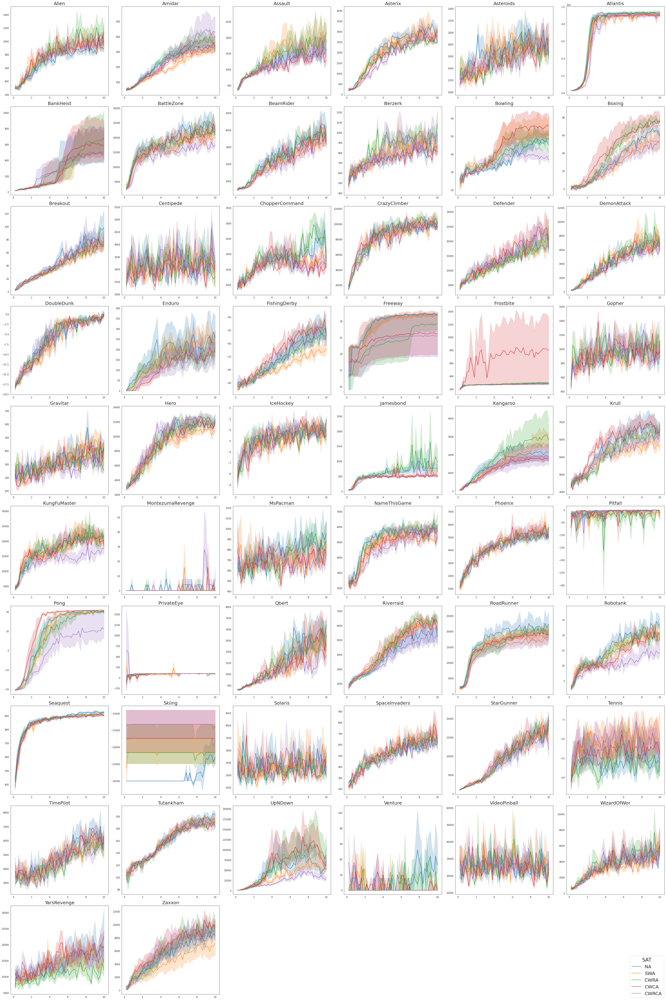

In [230]:
# results = post_processed_results_56
# game_list = GAMES_56.copy()
# sat_list = SELF_ATTN_TYPES.copy()
# seed_list = SEEDS.copy()
# smoothing = False
# smooth_weight = 0.98
# no_million = False
# hue = 'a'
# n_boot = 10
# seed_boot = 42
# linewidth = 2
# suptitle = None
# fontsize_suptitle = 30
# position_suptitle = (0.5, 1.1)
# figsize = (40,60)
# fontsize_subtitle = 20
# ncols = 6
# fontsize_legend = 20
# legend_title = 'SAT'
# fontsize_legend_title = 22
# savefig = True

# plot_grouped_results_table(results, game_list, sat_list, seed_list, smoothing=smoothing, smooth_weight=smooth_weight, no_million=no_million, \
#                            hue=hue, n_boot=n_boot, seed_boot=seed_boot, linewidth=linewidth, \
#                            suptitle=suptitle, fontsize_suptitle=fontsize_suptitle, position_suptitle=position_suptitle, \
#                            figsize=figsize, fontsize_subtitle=fontsize_subtitle, ncols=ncols, \
#                            fontsize_legend=fontsize_legend, legend_title=legend_title, fontsize_legend_title=fontsize_legend_title, \
#                            savefig=savefig)

With DEMA smoothing

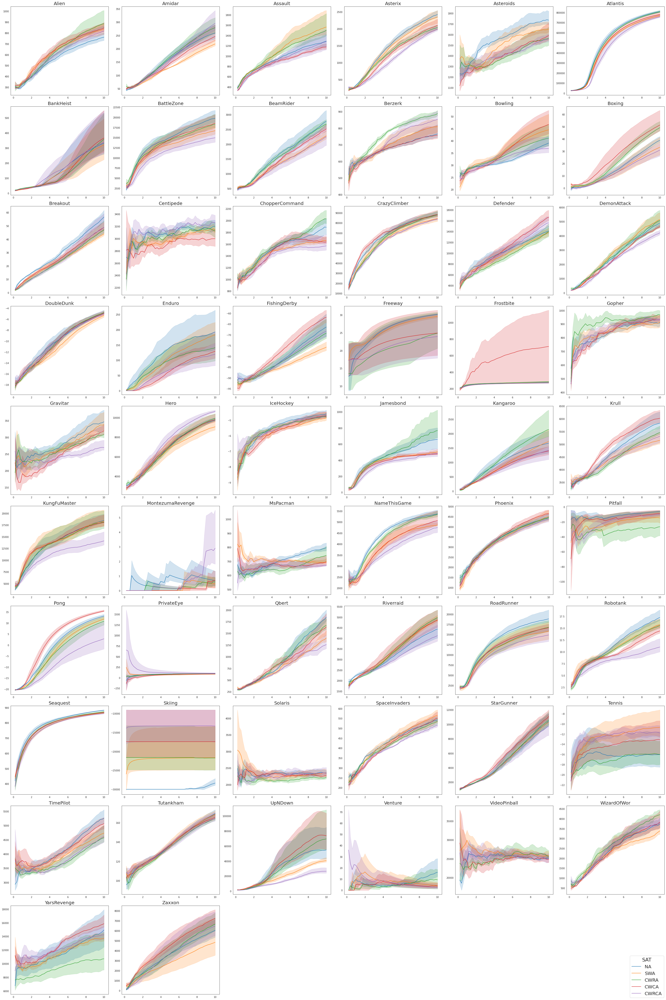

In [234]:
# results = post_processed_results_56
# game_list = GAMES_56.copy()
# sat_list = SELF_ATTN_TYPES.copy()
# seed_list = SEEDS.copy()
# smoothing = True
# smooth_weight = 0.98
# no_million = False
# hue = 'a'
# n_boot = 10
# seed_boot = 42
# linewidth = 2
# suptitle = None
# fontsize_suptitle = 30
# position_suptitle = (0.5, 1.1)
# figsize = (40,60)
# fontsize_subtitle = 20
# ncols = 6
# fontsize_legend = 20
# legend_title = 'SAT'
# fontsize_legend_title = 22
# savefig = True

# plot_grouped_results_table(results, game_list, sat_list, seed_list, smoothing=smoothing, smooth_weight=smooth_weight, no_million=no_million, \
#                            hue=hue, n_boot=n_boot, seed_boot=seed_boot, linewidth=linewidth, \
#                            suptitle=suptitle, fontsize_suptitle=fontsize_suptitle, position_suptitle=position_suptitle, \
#                            figsize=figsize, fontsize_subtitle=fontsize_subtitle, ncols=ncols, \
#                            fontsize_legend=fontsize_legend, legend_title=legend_title, fontsize_legend_title=fontsize_legend_title, \
#                            savefig=savefig)

### Utilities for plotting rliable plots

Copy the Human and Random scores from [deep_rl_precipice_colab.ipynb](https://github.com/google-research/rliable/blob/master/deep_rl_precipice_colab.ipynb)

In [129]:
# copied from deep_rl_precipice_colab.ipynb which took the scores from the agent57 paper, Appendix "H.4. Atari 57 Table of Scores"
# table header: Games, Average Human, Random, Agent57, R2D2 (Bandit), MuZero
# note: the term "Average Human" could be used to differentiate between a professional player and a world-record holder 
score_str = """alien 7127.70 227.80 297638.17 ± 37054.55 464232.43 ± 7988.66 741812.63
amidar 1719.50 5.80 29660.08 ± 880.39 31331.37 ± 817.79 28634.39
assault 742.00 222.40 67212.67 ± 6150.59 110100.04 ± 346.06 143972.03
asterix 8503.30 210.00 991384.42 ± 9493.32 999354.03 ± 12.94 998425.00
asteroids 47388.70 719.10 150854.61 ± 16116.72 431072.45 ± 1799.13 6785558.64
atlantis 29028.10 12850.00 1528841.76 ± 28282.53 1660721.85 ± 14643.83 1674767.20
bank_heist 753.10 14.20 23071.50 ± 15834.73 27117.85 ± 963.12 1278.98
battle_zone 37187.50 2360.00 934134.88 ± 38916.03 992600.31 ± 1096.19 848623.00
beam_rider 16926.50 363.90 300509.80 ± 13075.35 390603.06 ± 23304.09 4549993.53
berzerk 2630.40 123.70 61507.83 ± 26539.54 77725.62 ± 4556.93 85932.60
bowling 160.70 23.10 251.18 ± 13.22 161.77 ± 99.84 260.13
boxing 12.10 0.10 100.00 ± 0.00 100.00 ± 0.00 100.00
breakout 30.50 1.70 790.40 ± 60.05 863.92 ± 0.08 864.00
centipede 12017.00 2090.90 412847.86 ± 26087.14 908137.24 ± 7330.99 1159049.27
chopper_command 7387.80 811.00 999900.00 ± 0.00 999900.00 ± 0.00 991039.70
crazy_climber 35829.40 10780.50 565909.85 ± 89183.85 729482.83 ± 87975.74 458315.40
defender 18688.90 2874.50 677642.78 ± 16858.59 730714.53 ± 715.54 839642.95
demon_attack 1971.00 152.10 143161.44 ± 220.32 143913.32 ± 92.93 143964.26
double_dunk -16.40 -18.60 23.93 ± 0.06 24.00 ± 0.00 23.94
enduro 860.50 0.00 2367.71 ± 8.69 2378.66 ± 3.66 2382.44
fishing_derby -38.70 -91.70 86.97 ± 3.25 90.34 ± 2.66 91.16
freeway 29.60 0.00 32.59 ± 0.71 34.00 ± 0.00 33.03
frostbite 4334.70 65.20 541280.88 ± 17485.76 309077.30 ± 274879.03 631378.53
gopher 2412.50 257.60 117777.08 ± 3108.06 129736.13 ± 653.03 130345.58
gravitar 3351.40 173.00 19213.96 ± 348.25 21068.03 ± 497.25 6682.70
hero 30826.40 1027.00 114736.26 ± 49116.60 49339.62 ± 4617.76 49244.11
ice_hockey 0.90 -11.20 63.64 ± 6.48 86.59 ± 0.59 67.04
jamesbond 302.80 29.00 135784.96 ± 9132.28 158142.36 ± 904.45 41063.25
kangaroo 3035.00 52.00 24034.16 ± 12565.88 18284.99 ± 817.25 16763.60
krull 2665.50 1598.00 251997.31 ± 20274.39 245315.44 ± 48249.07 269358.27
kung_fu_master 22736.30 258.50 206845.82 ± 11112.10 267766.63 ± 2895.73 204824.00
montezuma_revenge 4753.30 0.00 9352.01 ± 2939.78 3000.00 ± 0.00 0.00
ms_pacman 6951.60 307.30 63994.44 ± 6652.16 62595.90 ± 1755.82 243401.10
name_this_game 8049.00 2292.30 54386.77 ± 6148.50 138030.67 ± 5279.91 157177.85
phoenix 7242.60 761.40 908264.15 ± 28978.92 990638.12 ± 6278.77 955137.84
pitfall 6463.70 -229.40 18756.01 ± 9783.91 0.00 ± 0.00 0.00
pong 14.60 -20.70 20.67 ± 0.47 21.00 ± 0.00 21.00
private_eye 69571.30 24.90 79716.46 ± 29515.48 40700.00 ± 0.00 15299.98
qbert 13455.00 163.90 580328.14 ± 151251.66 777071.30 ± 190653.94 72276.00
riverraid 17118.00 1338.50 63318.67 ± 5659.55 93569.66 ± 13308.08 323417.18
road_runner 7845.00 11.50 243025.80 ± 79555.98 593186.78 ± 88650.69 613411.80
robotank 11.90 2.20 127.32 ± 12.50 144.00 ± 0.00 131.13
seaquest 42054.70 68.40 999997.63 ± 1.42 999999.00 ± 0.00 999976.52
skiing -4336.90 -17098.10 -4202.60 ± 607.85 -3851.44 ± 517.52 -29968.36
solaris 12326.70 1236.30 44199.93 ± 8055.50 67306.29 ± 10378.22 56.62
space_invaders 1668.70 148.00 48680.86 ± 5894.01 67898.71 ± 1744.74 74335.30
star_gunner 10250.00 664.00 839573.53 ± 67132.17 998600.28 ± 218.66 549271.70
surround 6.50 -10.00 9.50 ± 0.19 10.00 ± 0.00 9.99
tennis -8.30 -23.80 23.84 ± 0.10 24.00 ± 0.00 0.00
time_pilot 5229.20 3568.00 405425.31 ± 17044.45 460596.49 ± 3139.33 476763.90
tutankham 167.60 11.40 2354.91 ± 3421.43 483.78 ± 37.90 491.48
up_n_down 11693.20 533.40 623805.73 ± 23493.75 702700.36 ± 8937.59 715545.61
venture 1187.50 0.00 2623.71 ± 442.13 2258.93 ± 29.90 0.40
video_pinball 17667.90 0.00 992340.74 ± 12867.87 999645.92 ± 57.93 981791.88
wizard_of_wor 4756.50 563.50 157306.41 ± 16000.00 183090.81 ± 6070.10 197126.00
yars_revenge 54576.90 3092.90 998532.37 ± 375.82 999807.02 ± 54.85 553311.46
zaxxon 9173.30 32.50 249808.90 ± 58261.59 370649.03 ± 19761.32 725853.90"""

In [130]:
def get_reference_scores(score_str: str, games_to_skip: List[str]=['Surround']) -> Tuple[dict, dict]:
    """
    extract reference scores from the score string
    game Surround is not included in our game set

    :param score_str: the score string copied from the 'Table of scores' from the Agent57 paper
    :param games_to_skip: games to skip, each game str does not include the version info and it is camelized
    :return: the reference scores, i.e., the random agent scores and the averaged human scores
    :rtype: Tuple[dict, dict]
    """
    # extract random and human scores
    scores = score_str.split('\n') # split by newline
    ALL_HUMAN_SCORES = {}
    ALL_RANDOM_SCORES = {}
    
    for sc in scores:
        arr = sc.split(' ')
        game = inflection.camelize(arr[0]) # camelize the game name
        ALL_HUMAN_SCORES[game] = float(arr[1])
        ALL_RANDOM_SCORES[game] = float(arr[2])

    # remove games if any
    for game in games_to_skip:
        ALL_HUMAN_SCORES.pop(game)
        ALL_RANDOM_SCORES.pop(game)

    return ALL_HUMAN_SCORES, ALL_RANDOM_SCORES

In [131]:
ALL_HUMAN_SCORES, ALL_RANDOM_SCORES = get_reference_scores(score_str, games_to_skip=['Surround'])

Obtain Human Normalized Scores (HNS)

In [138]:
def normalize_score(score_arr: np.ndarray, game: str) -> np.ndarray:
    """
    generate the human-normalized score array based on reference scores
    normalized_score = (score - random_score)/(human_score - random_score)

    :param score_arr: the score array to be normalized element-wise
    :param game: the name of the game (both with and without game version should work)
    :return: the human-normalized score array
    :rtype: np.ndarray
    """
    # remove game version
    game_no_version = game.replace(GAME_VERSION, '')
    random_score = ALL_RANDOM_SCORES.get(game_no_version)
    human_score = ALL_HUMAN_SCORES.get(game_no_version)
    assert random_score is not None, f"the random score for game {game_no_version} cannot be retrieved!"
    assert human_score is not None, f"the human score for game {game_no_version} cannot be retrieved!"
    # normalization
    score_arr_normalized = (score_arr - random_score) / (human_score - random_score)

    return score_arr_normalized

Obtain the normalized score dict

In [140]:
def get_hns_dict(results: dict, sat_list: List[str], game_list: List[str], \
                 smoothing: bool=False, smooth_weight: float=SMOOTH_WEIGHT) -> Tuple[dict, dict, dict]:
    """
    compute human-normalized score dicts with keys being the algorithms and values being the human-normalized scores

    :param results: the post-processed results based on evaluations.npz files
    :param sat_list: the list of self-attn algorithms
    :param game_list: the list of Atari games
    :param smoothing: whether to smooth the evaluation scores along the n_eval dimension
    :param smooth_weight: the weight of EMA
    :return: score dicts based on 'last evals', 'mean evals' and 'all evals' (the order matters here)
    :rtype: tuple of dicts
    """
    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']

    assert game_list is not None and sat_list is not None, 'game and self-attention type must not be None!'
    assert len(game_list) != 0 and len(sat_list) != 0, 'game and self-attention type must not be empty!'

    # initialize HNS dicts
    last_eval_hns_dict, mean_eval_hns_dict, all_eval_hns_dict = {}, {}, {}
    n_sats = len(sat_list) # for sanity check
    n_games = len(game_list) # for sanity check
    
    # normalize scores per sat and game
    for sat in sat_list:
        # initialize HNS containers
        last_eval_hns, mean_eval_hns, all_eval_hns = [], [], []
        for game in game_list:
            # get mean_per_eval (n_eval, n_runs)
            mean_per_eval = results_[game][sat]['mean_per_eval']
            n_eval, n_runs = mean_per_eval.shape
            assert n_eval >= 1, f"game {game}, sat {sat} has < 1 evaluation checkpoint!"
            assert n_runs == len(SEEDS), f"game {game}, sat {sat} should have {len(SEEDS)} runs!"
            if smoothing:
                print(f"smoothing the eval scores for {game}, {sat}...")
                # smoothing all eval scores along the n_eval
                # we need to transpose the array to reshape it from (n_runs, n_eval) to (n_eval, n_runs)
                mean_per_eval_smoothed = np.array([smooth_dema(mean_per_eval[:, run_id], smooth_weight) for run_id in n_runs]).T
                assert mean_per_eval_smoothed.shape == (n_eval, n_runs), f"the smoothed mean_per_eval array should maintain its shape!"
                # overright the original mean_per_eval
                mean_per_eval = mean_per_eval_smoothed
            # append last evals of shape (n_runs,)
            last_eval_hns.append(mean_per_eval[-1, :]) # select the last row only
            # append mean evals of shape (n_runs,)
            mean_eval_hns.append(np.mean(mean_per_eval, axis=0)) # apply mean along the n_eval dimension
            # append all evals of shape (n_eval, n_runs)
            all_eval_hns.append(mean_per_eval) # append the entire mean_per_eval array
            # normalize the most recently appended eval score array in each list (in-place)
            # all the following lists should have a length of n_games
            last_eval_hns[-1] = normalize_score(last_eval_hns[-1], game) # (n_games, n_runs)
            mean_eval_hns[-1] = normalize_score(mean_eval_hns[-1], game) # (n_games, n_runs)
            all_eval_hns[-1] = normalize_score(all_eval_hns[-1], game) # (n_games, n_eval, n_runs)
        # convert eval score list to array and follow the rliable format
        last_eval_hns_dict[sat] = np.array(last_eval_hns).T # the score array's shape should be (n_runs, n_games)
        mean_eval_hns_dict[sat] = np.array(mean_eval_hns).T # the score array's shape should be (n_runs, n_games)
        all_eval_hns_dict[sat] = np.array(all_eval_hns).transpose((2, 0, 1)) # the score array's shape should be (n_runs, n_games, n_eval)
    # check score dict shape
    assert len(last_eval_hns_dict) == n_sats, f"final last score dict should contain {n_sats} algorithms!"
    assert len(mean_eval_hns_dict) == n_sats, f"final mean score dict should contain {n_sats} algorithms!"
    assert len(all_eval_hns_dict) == n_sats, f"final all score dict should contain {n_sats} algorithms!"

    return last_eval_hns_dict, mean_eval_hns_dict, all_eval_hns_dict

Generate HNS score dicts

In [141]:
results = post_processed_results_56
sat_list = SELF_ATTN_TYPES.copy()
game_list = GAMES_56.copy()
n_games = len(game_list)
n_runs = len(SEEDS)
n_eval = N_EVALUATION_CHECKPOINT

last_eval_hns_dict_56, mean_eval_hns_dict_56, all_eval_hns_dict_56 = get_hns_dict(results, sat_list, game_list)

Aggregate performance

In [163]:
def plot_aggregate_performance(hns_dicts: Tuple[dict, dict], use_last: bool=True, ci_method: str='percentile', task_bootstrap: bool=False, \
                               reps: int=2000, ci_size: float=0.95, seed: int=None, subfigure_width: float=None, row_height: float=None, \
                               xlabel_y_coord: float=None, interval_height: float=None, wspace: float=None, adjust_bottom: float=None, \
                               savefig: bool=True, figname: str=None) -> None:
    """
    plot the aggregate performance of the aggregate metrics (Median, IQM, Mean, and Optimality Gap)
    compared to mean, IQM is robust to outliers, yet has considerably less bias than median

    :param hns_dicts: the HNS dictionaries based on 'last evals' and 'mean evals' (the order matters here)
    :param use_last: use the HNS score dict based on the 'last evals', if False, use the HNS score dict based on the 'mean evals'
    :param ci_method: method for computing confidence interval, default as 'percentile'
    :param task_bootstrap: Whether to perform bootstrapping over tasks in addition to runs. Defaults to False.
    :param reps: number of bootstrap replications, default as 2000
    :param ci_size: the coverage of confidence interval
    :param seed: to seed the Numpy RandomState for reproducible bootstrapping
    :param subfigure_width: the width of each subfigure which represents an aggregate metric
    :param row_height: the height of each row in a subfigure
    :param xlabel_y_coord: the y-coordinate of the x-axis label
    :param interval_height: the heights of the horizontal bars
    :param wspace: the width of the padding between subplots
    :param adjust_bottom: the position of the bottom edge of the subplots, as a fraction of the figure height
    :param savefig: save the figure as a pdf file
    :parma figname: the name of the figure (to be used as the filename)
    :return: None
    """
    # expand the dict container
    last_eval_hns_dict, mean_eval_hns_dict = hns_dicts
    assert last_eval_hns_dict, f"'last_eval_hns_dict' can not be empty!"
    assert mean_eval_hns_dict, f"'mean_eval_hns_dict' can not be empty!"
    # get all algorithms to compare with
    algorithms = SELF_ATTN_TYPES.copy()

    # group all aggregate metrics into a numpy array and create a lambda function
    # x is the HNS score array which must be in the shape of (n_runs, n_games)
    # each aggregate metric/func computes an aggregate score using the HNS score array
    # the lambda func returns a 1-D array of size 4, each element in the array is an aggregate score
    aggregate_func = lambda x: np.array(
        [
            metrics.aggregate_median(x),
            metrics.aggregate_iqm(x),
            metrics.aggregate_mean(x),
            metrics.aggregate_optimality_gap(x),
        ]
    )

    # choose which HNS dict to use
    # we follow the variable naming used in 'plot_from_file.py'
    # use 'mean eval' to yield smaller CIs
    normalized_score_dict = deepcopy(last_eval_hns_dict) if use_last else deepcopy(mean_eval_hns_dict)
    # intialize a RandomState for reproducible bootstrapping
    rs = RandomState(seed) if seed is not None else None
    
    # get interval estimates
    # computes interval estimates via stratified bootstrap confidence intervals
    # aggregate_scores = point_estimates
    # aggregate_scores_cis = Confidence intervals (CIs) for point estimates
    aggregate_scores, aggregate_scores_cis = rly.get_interval_estimates(
        normalized_score_dict, # each key/algo has a score array of shape (n_runs, n_games)
        aggregate_func, # the lambda function
        method=ci_method, # one of 'basic', 'percentile', 'bc' and 'bca'
        task_bootstrap=task_bootstrap, # whether to bootstrap over tasks/games
        reps=reps,  # number of bootstrap replications
        confidence_interval_size=ci_size, # coverage of confidence interval
        random_state=rs, # RandomState to use to ensure reproducable results
    )
    # plot interval estimates
    # plots various metrics with confidence intervals
    # To indicate the range within which an algorithm’s aggregate performance is believed to lie
    fig, axes = plot_utils.plot_interval_estimates(
        aggregate_scores,
        aggregate_scores_cis,
        metric_names=["Median", "IQM", "Mean", "Optimality Gap"], # this should be in the same order as defined in aggregate_func
        algorithms=algorithms,
        colors=None,
        color_palette='colorblind',
        max_ticks=4, # find nice tick locations with no more than `max_ticks`. Passed to `plt.MaxNLocator`.
        subfigure_width=subfigure_width, # width of each subfigure, shorter width produces nicer figure
        row_height=row_height, # height of each row in a subfigure
        xlabel_y_coordinate=xlabel_y_coord, # y-coordinate of the x-axis label
        xlabel="Human Normalized Score", # label of x-axis
        interval_height=interval_height, # the heights of the bars
        wspace=wspace, # the width of the padding between subplots
    )
    fig.canvas.manager.set_window_title("Aggregate Performance") # Set the title text of the window containing the figure.
    # Adjust margin to see the x label
    # fig.tight_layout() somehow shifts the xlabel to the left, we can uncomment this and then save the figure without the xlabel and then add the xlabel manually using PDF editor
    # alternatively, we can simply use bbox_inches='tight' in fig.savefig()
    # fig.tight_layout()
    plt.subplots_adjust(bottom=adjust_bottom)
    if savefig:
        figure_fp = os.path.join(FIGURE_PATH_EVALUATION, RLIABLE_PATH)
        figure_fn = figname + FIGURE_EXT
        fig.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight')

Use `mean evals`

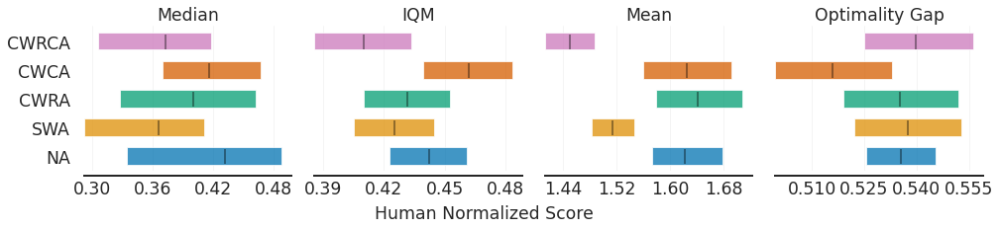

In [166]:
# use mean evals (bootstrap over runs only)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
task_bootstrap = False
reps = 2000
seed = None
subfigure_width = 3.5
row_height = 0.6
xlabel_y_coord = -0.02
interval_height = 0.6
wspace = 0.11
adjust_bottom = 0.2
savefig = True
figname = "Aggregate performance (bootstrap over runs and use mean evals)"
plot_aggregate_performance(hns_dicts, use_last=use_last, task_bootstrap=task_bootstrap, reps=reps, seed=seed, \
                           subfigure_width=subfigure_width, row_height=row_height, xlabel_y_coord=xlabel_y_coord, \
                           interval_height=interval_height, wspace=wspace, adjust_bottom=adjust_bottom, \
                           savefig=savefig, figname=figname)

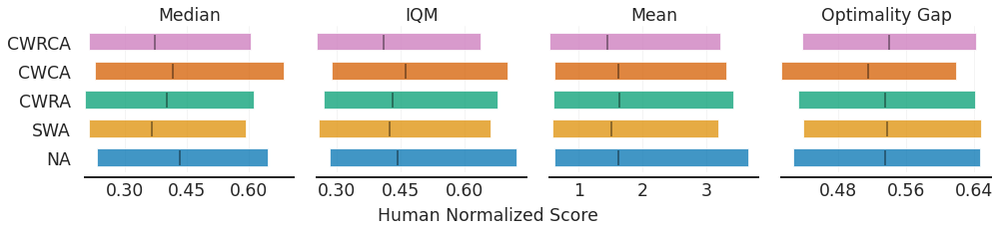

In [167]:
# use mean evals (bootstrap over runs and games)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
task_bootstrap = True
reps = 2000
seed = None
subfigure_width = 3.5
row_height = 0.6
xlabel_y_coord = -0.02
interval_height = 0.6
wspace = 0.11
adjust_bottom = 0.2
savefig = True
figname = "Aggregate performance (bootstrap over runs & games and use mean evals)"
plot_aggregate_performance(hns_dicts, use_last=use_last, task_bootstrap=task_bootstrap, reps=reps, seed=seed, \
                           subfigure_width=subfigure_width, row_height=row_height, xlabel_y_coord=xlabel_y_coord, \
                           interval_height=interval_height, wspace=wspace, adjust_bottom=adjust_bottom, \
                           savefig=savefig, figname=figname)

Performance profile

In [168]:
def plot_performance_profile(hns_dicts: Tuple[dict, dict], use_last: bool=True, tau_start: float=0, tau_stop: float=2, tau_num: int=50, \
                             use_score_distribution: bool=True, ci_method: str='percentile', task_bootstrap: bool=False, \
                             reps: int=2000, ci_size: float=0.95, seed: int=None, figsize: Tuple[float, float]=None, \
                             use_non_linear_scaling: bool=False, alpha: float=None, linestyles: dict=None, linewidth: float=None, \
                             inset: bool=False, inset_x_coord: float=None, inset_y_coord: float=None, \
                             inset_width: float=None, inset_height: float=None, inset_xlim_lower: float=None, inset_xlim_upper: float=None, \
                             inset_ylim_lower: float=None, inset_ylim_upper: float=None, inset_xticks: list=[], \
                             legend_loc: str='best', savefig: bool=True, figname: str=None) -> None:
    """
    plot the performance profiles for all algorithms
    performance proﬁles reveal performance variability across games much better than interval estimates of aggregate metrics, 
    particularly well-suited to the few-run regime

    :param hns_dicts: the HNS dictionaries based on 'last evals' and 'mean evals' (the order matters here)
    :param use_last: use the HNS score dict based on the 'last evals', if False, use the HNS score dict based on the 'mean evals'
    :param tau_start: the starting value of the tau list
    :param tau_stop: the stopping value of the tau list
    :param tau_num: the number of samples to generate for the tau list
    :param use_score_distribution: whether to report score distributions or average score distributions
    :param ci_method: method for computing confidence interval, default as 'percentile'
    :param task_bootstrap: Whether to perform bootstrapping over tasks in addition to runs. Defaults to False.
    :param reps: number of bootstrap replications, default as 2000
    :param ci_size: the coverage of confidence interval, default as 0.95
    :param seed: to seed the Numpy RandomState for reproducible bootstrapping (random_state is not defined for performance profiles in rliable's source code)
    :param figsize: the size of the figure
    :param use_non_linear_scaling: whether to scale the x-axis in proportion to the number of runs within any specified range
    :param alpha: the degree of transparency of the shaded regions corresponding to the confidence intervals
    :param linestyles: a dict which maps each method to a linestyle. If None, then the 'solid' linestyle is used for all methods.
    :param linewidth: the width of the line
    :param inset: whether to add an inset plot to zoom in to a particular region
    :param inset_x_coord: the bottom left x coordinate of the inset in percentage of the parent x-axis
    :param inset_y_coord: the bottom left y coordinate of the inset in percentage of the parent y-axis
    :param inset_width: the width of the inset in percentage of the parent x-axis
    :param inset_height: the height of the inset in percentage of the parent y-axis
    :param inset_xlim_lower: the lower limit of the x-axis of the inset
    :param inset_xlim_upper: the upper limit of the x-axis of the inset
    :param inset_ylim_lower: the lower limit of the y-axis of the inset
    :param inset_ylim_upper: the upper limit of the y-axis of the inset
    :param inset_xticks: the xticks of the inset in the list format
    :param legend_loc: the legend location of the parent axes
    :param savefig: save the figure as a pdf file
    :parma figname: the name of the figure (to be used as the filename)
    :return: None
    """
    # expand the dict container
    last_eval_hns_dict, mean_eval_hns_dict = hns_dicts
    assert last_eval_hns_dict, f"'last_eval_hns_dict' can not be empty!"
    assert mean_eval_hns_dict, f"'mean_eval_hns_dict' can not be empty!"
    # get all algorithms to compare with
    algorithms = SELF_ATTN_TYPES.copy()

    # choose which HNS dict to use
    # we follow the variable naming used in 'plot_from_file.py'
    # use 'mean eval' to yield smaller CIs
    normalized_score_dict = deepcopy(last_eval_hns_dict) if use_last else deepcopy(mean_eval_hns_dict)
    # define the tau list
    normalized_score_thresholds = np.linspace(tau_start, tau_stop, tau_num) # this is the tau_list
    # intialize a RandomState for reproducible bootstrapping
    # rs = RandomState(seed) if seed is not None else None # random_state is not defined in create_performance_profile()
    
    # create performance profiles (get HNS score distributions)
    # it actually calls get_interval_estimates() but with func=profile_function
    # score_distributions = a dictionary of performance profiles for each key in `score_dict`, each profile is a 1D np array of same size as `tau_list`.
    # score_distributions_cis = The 95% confidence intervals of profiles evaluated at all threshdolds in `tau_list`.
    score_distributions, score_distributions_cis = rly.create_performance_profile(
        normalized_score_dict, # each key/algo has a score array of shape (n_runs, n_games)
        normalized_score_thresholds, # the tau_list, List or 1D numpy array of threshold values on which the profile is evaluated
        use_score_distribution=use_score_distribution, # whether to report score distributions or average score distributions
        custom_profile_func=None, # custom performance profile function, use the default rliable's profile_function
        method=ci_method, # Bootstrap method for `StratifiedBootstrap`, defaults to 'percentile'
        task_bootstrap=task_bootstrap, # whether to bootstrap over tasks/games
        reps=reps,  # number of bootstrap replications
        confidence_interval_size=ci_size, # coverage of confidence interval
    )
    # plot performance profiles (HNS score distributions) with stratified confidence intervals
    # to reveal performance variability across games
    fig, ax = plt.subplots(ncols=1, figsize=figsize)
    color_dict = dict(zip(algorithms, sns.color_palette("colorblind")))
    plot_utils.plot_performance_profiles(
        score_distributions, # performance profiles, a dict mapping a method to its performance profile
        normalized_score_thresholds, # the tau list
        performance_profile_cis=score_distributions_cis, # the confidence intervals (default 95%) of performance profiles
        use_non_linear_scaling=use_non_linear_scaling, # Whether to scale the x-axis in proportion to the number of runs within any specified range
        ax=ax, # the matplotlib axis (`matplotlib.axes` object) to plot the performance profiles
        colors=color_dict, # Maps each method to a color. If None, then this mapping is created based on `color_palette`
        color_palette='colorblind', # used when colors is None
        alpha=alpha, # Changes the transparency of the shaded regions corresponding to the confidence intervals.
        figsize=figsize, # Only used when `ax` is None.
        xticks=None, # The list of x-axis tick locations.
        yticks=None, # The list of y-axis tick locations between 0 and 1, If None, defaults to `[0, 0.25, 0.5, 0.75, 1.0]`.
        xlabel=r"Human Normalized Score $(\tau)$",
        ylabel=r'Fraction of runs with score $> \tau$', 
        linestyles=linestyles, # Maps each method to a linestyle. If None, then the 'solid' linestyle is used for all methods.
        linewidth=linewidth, # set the linewidth
    )
    # plot inset (zoom in)
    if inset:
        from mpl_toolkits.axes_grid1.inset_locator import (inset_axes, InsetPosition, mark_inset)
        colors = sns.color_palette('colorblind')
        ax2 = plt.axes([0, 0, 1, 1])
        ip = InsetPosition(ax, [inset_x_coord, inset_y_coord, inset_width, inset_height])
        ax2.set_axes_locator(ip)
        mark_inset(ax, ax2, loc1=2, loc2=4, fc='none', ec='0.5')
        for idx, algo in enumerate(algorithms):
            ci = score_distributions_cis[algo]
            # Inset
            ax2.plot(normalized_score_thresholds, score_distributions[algo], color=colors[idx], linewidth=2, label=algo)
            ax2.fill_between(normalized_score_thresholds, ci[0], ci[1], color=colors[idx], alpha=0.2)
        # Set x/y limits for inset
        ax2.set_xlim((inset_xlim_lower, inset_xlim_upper))
        ax2.set_ylim((inset_ylim_lower, inset_ylim_upper))
        # Change tick sizes in inset
        for tick in ax2.xaxis.get_major_ticks():
            tick.label1.set_fontsize('large') # originally set as 'x-large'
        for tick in ax2.yaxis.get_major_ticks():
            tick.label1.set_fontsize('large') # originally set as 'x-large'
        ax2.set_xticks(inset_xticks)
        
    fig.canvas.manager.set_window_title("Performance Profiles")
    ax.legend(loc=legend_loc) # legend for the main/parent axis
    # fig.tight_layout() # not compatible with inset axis, use bbox_inches='tight' instead
    if savefig:
        figure_fp = os.path.join(FIGURE_PATH_EVALUATION, RLIABLE_PATH)
        figure_fn = figname + FIGURE_EXT
        fig.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight')

Use `mean evals`

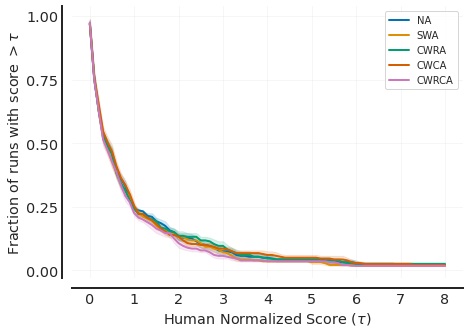

In [173]:
# use mean evals, use score dist (bootstrap over runs)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
tau_start = 0
tau_stop = 8
tau_num = 81
use_score_distribution = True
task_bootstrap = False
reps = 2000
seed = None
alpha = 0.15
figsize = (7, 5)
linestyles=None
linewidth = 2.0
savefig = True # to save the figure, turn on plt.tight_layout()
figname = "Performance profiles (bootstrap over runs and use mean evals, use score dist)"

plot_performance_profile(hns_dicts, use_last=use_last, tau_start=tau_start, tau_stop=tau_stop, tau_num=tau_num, \
                         use_score_distribution=use_score_distribution, task_bootstrap=task_bootstrap, \
                         reps=reps, seed=seed, figsize=figsize, alpha=alpha, linestyles=linestyles, linewidth=linewidth, \
                         savefig=savefig, figname=figname)

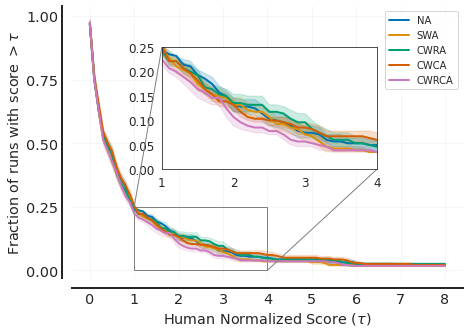

In [174]:
# use mean evals, use score dist (bootstrap over runs), add inset plot
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
tau_start = 0
tau_stop = 8
tau_num = 81
use_score_distribution = True
task_bootstrap = False
reps = 2000
seed = None
alpha = 0.15
figsize = (7, 5)
linestyles=None
linewidth = 2.0
inset = True
inset_x_coord = 0.23
inset_y_coord = 0.4
inset_width = 0.55
inset_height = 0.45
inset_xlim_lower = 1
inset_xlim_upper = 4
inset_ylim_lower = 0.0
inset_ylim_upper = 0.25
inset_xticks = [1, 2, 3, 4]
legend_loc = 'best'
savefig = True # to save the figure, turn on plt.tight_layout()
figname = "Performance profiles with inset (bootstrap over runs and use mean evals, use score dist)"

plot_performance_profile(hns_dicts, use_last=use_last, tau_start=tau_start, tau_stop=tau_stop, tau_num=tau_num, \
                         use_score_distribution=use_score_distribution, task_bootstrap=task_bootstrap, \
                         reps=reps, seed=seed, figsize=figsize, alpha=alpha, linestyles=linestyles, linewidth=linewidth, \
                         inset=inset, inset_x_coord=inset_x_coord, inset_y_coord=inset_y_coord, inset_width=inset_width, inset_height=inset_height, \
                         inset_xlim_lower=inset_xlim_lower, inset_xlim_upper=inset_xlim_upper, \
                         inset_ylim_lower=inset_ylim_lower, inset_ylim_upper=inset_ylim_upper, inset_xticks=inset_xticks, \
                         legend_loc=legend_loc, savefig=savefig, figname=figname)

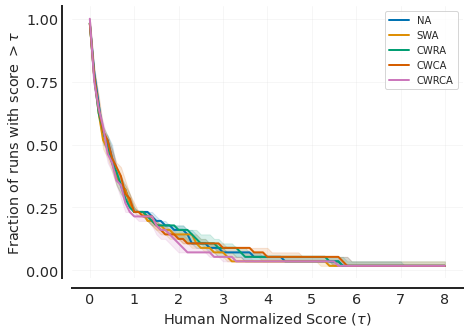

In [175]:
# use mean evals, use avg score dist (bootstrap over runs)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
tau_start = 0
tau_stop = 8
tau_num = 81
use_score_distribution = False # use avg score dist
task_bootstrap = False
reps = 2000
seed = None
alpha = 0.15
figsize = (7, 5)
linestyles=None
linewidth = 2.0
savefig = True # to save the figure, turn on plt.tight_layout()
figname = "Performance profiles (bootstrap over runs and use mean evals, use avg score dist)"

plot_performance_profile(hns_dicts, use_last=use_last, tau_start=tau_start, tau_stop=tau_stop, tau_num=tau_num, \
                         use_score_distribution=use_score_distribution, task_bootstrap=task_bootstrap, \
                         reps=reps, seed=seed, figsize=figsize, alpha=alpha, linestyles=linestyles, linewidth=linewidth, \
                         savefig=savefig, figname=figname)

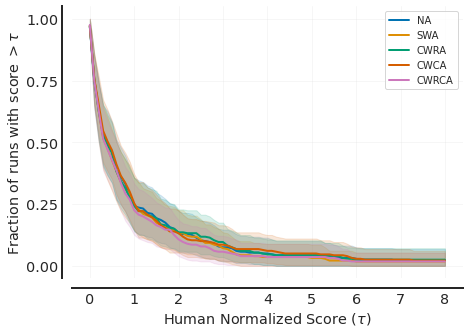

In [176]:
# use mean evals, use score dist (bootstrap over runs and games)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
tau_start = 0
tau_stop = 8
tau_num = 81
use_score_distribution = True
task_bootstrap = True
reps = 2000
seed = None
alpha = 0.15
figsize = (7, 5)
linestyles=None
linewidth = 2.0
savefig = True # to save the figure, turn on plt.tight_layout()
figname = "Performance profiles (bootstrap over runs & games and use mean evals, use score dist)"

plot_performance_profile(hns_dicts, use_last=use_last, tau_start=tau_start, tau_stop=tau_stop, tau_num=tau_num, \
                         use_score_distribution=use_score_distribution, task_bootstrap=task_bootstrap, \
                         reps=reps, seed=seed, figsize=figsize, alpha=alpha, linestyles=linestyles, linewidth=linewidth, \
                         savefig=savefig, figname=figname)

Probability of improvement

In [179]:
def plot_prob_of_improvement(hns_dicts: Tuple[dict, dict], use_last: bool=True, ci_method: str='percentile', task_bootstrap: bool=False, \
                             reps: int=1000, ci_size: float=0.95, seed: int=None, algo_X: str=None, figsize: Tuple[float, float]=None, \
                             alpha: float=None, interval_height: float=None, wrect: float=None, ticklabelsize: str=None, labelsize: str=None, \
                             ylabel_x_coordinate: float=None, savefig: bool=True, figname: str=None) -> None:
    """
    plot the probability of improvement P(X > Y) with confidence intervals
    note: P(X <= Y) = 1 - P(X > Y)

    :param hns_dicts: the HNS dictionaries based on 'last evals' and 'mean evals' (the order matters here)
    :param use_last: use the HNS score dict based on the 'last evals', if False, use the HNS score dict based on the 'mean evals'
    :param ci_method: method for computing confidence interval, default as 'percentile'
    :param task_bootstrap: Whether to perform bootstrapping over tasks in addition to runs. Defaults to False.
    :param reps: number of bootstrap replications, default as 1000 (prob_of_improvement plot takes much longer to generate)
    :param ci_size: the coverage of confidence interval, default as 0.95
    :param seed: to seed the Numpy RandomState for reproducible bootstrapping (random_state is not defined for performance profiles in rliable's source code)
    :param algo_X: if algo_X is given, compare only algo_X with the rest of the algorithms, otherwise, compare all algorithms pairwise
    :param figsize: the size of the figure
    :param alpha: the degree of transparency of the shaded regions corresponding to the confidence intervals
    :param interval_height: the height of the horizontal bars
    :param wrect: for setting the bottom spine position
    :param ticklabelsize: the size of the tick label
    :param labelsize: the size of the x and y labels
    :param ylabel_x_coordinate: x-coordinate of the y-label
    :param savefig: save the figure as a pdf file
    :parma figname: the name of the figure (to be used as the filename)
    :return: None
    """
    # expand the dict container
    last_eval_hns_dict, mean_eval_hns_dict = hns_dicts
    assert last_eval_hns_dict, f"'last_eval_hns_dict' can not be empty!"
    assert mean_eval_hns_dict, f"'mean_eval_hns_dict' can not be empty!"
    # get all algorithms to compare with
    algorithms = SELF_ATTN_TYPES.copy()

    # choose which HNS dict to use
    # we follow the variable naming used in 'plot_from_file.py'
    # use 'mean eval' to yield smaller CIs
    normalized_score_dict = deepcopy(last_eval_hns_dict) if use_last else deepcopy(mean_eval_hns_dict)
    # intialize a RandomState for reproducible bootstrapping
    rs = RandomState(seed) if seed is not None else None
    # create algorithm pairs based on algo_X
    algorithm_pairs = {} # key = 'x, y', value = (score_x, score_y)
    if algo_X is not None and algo_X in algorithms:
        # fixed algo1 as algo_X
        algo1 = algo_X
        for algo2 in algorithms:
            if algo2 == algo1:
                continue
            algorithm_pairs[f"{algo1}, {algo2}"] = (normalized_score_dict[algo1], normalized_score_dict[algo2])
    else:          
        # generate all possible combinations of algorithms as a list of 2-tuples
        algorithm_pairs_keys = itertools.combinations(algorithms, 2)
        # print(f"algorithm_pairs_keys: {algorithm_pairs_keys}")
        for algo1, algo2 in algorithm_pairs_keys:
            # note: there is a space being added between algo1 and algo2 in the key
            algorithm_pairs[f"{algo1}, {algo2}"] = (normalized_score_dict[algo1], normalized_score_dict[algo2])
    
    # compute averaged probabilities and their CIs
    # average_probabilities = a dict maps 'x, y' to P(x > y) averaged across tasks
    # average_probabilities_cis = a dict maps 'x, y' to the 95% confidence intervals of "P(x > y) averaged across tasks"
    average_probabilities, average_probabilities_cis = rly.get_interval_estimates(
        algorithm_pairs, 
        metrics.probability_of_improvement,
        method=ci_method, # one of 'basic', 'percentile', 'bc' and 'bca'
        task_bootstrap=task_bootstrap, # whether to bootstrap over tasks/games
        reps=reps,  # number of bootstrap replications
        confidence_interval_size=ci_size, # coverage of confidence interval
        random_state=rs, # RandomState to use to ensure reproducable results
    )
    # plot probability of improvement
    # to show how likely it is for X to outperform Y on a randomly selected task 
    plot_utils.plot_probability_of_improvement(
        average_probabilities, # Dictionary mapping algorithm pairs (X, Y) to a list or array containing probability of improvement of X over Y.
        average_probabilities_cis, # Dictionary mapping algorithm pairs (X, Y) to interval estimates corresponding to the `probability_estimates`.
        pair_separator=',', # default separator of algo1 and algo2
        ax=None, # `matplotlib.axes` object (to plot on this ax)
        figsize=figsize, # Size of the figure passed to `matplotlib.subplots`. Only used when `ax` is None.
        colors=None, # Maps each algorithm pair id to a color. If None, then this mapping is created based on `color_palette`.
        color_palette='colorblind', # Name of palette for `seaborn.color_palette` object
        alpha=alpha, # Changes the transparency of the shaded regions corresponding to the confidence intervals.
        xticks=None, # The list of x-axis tick locations.
        xlabel='P(X > Y)', # Label for the x-axis. Defaults to 'P(X > Y)'.
        left_ylabel='Algorithm X', # Label for the left y-axis. Defaults to 'Algorithm X'.
        right_ylabel='Algorithm Y', # Label for the left y-axis. Defaults to 'Algorithm Y'.
        interval_height=interval_height, # the heights of the bars
        wrect=wrect, # set the position of the bottom spine
        ticklabelsize=ticklabelsize, # the size of the tick label
        labelsize=labelsize, # the size of the x and y labels
        ylabel_x_coordinate=ylabel_x_coordinate, # x-position of the y-label
    )
    plt.gcf().canvas.manager.set_window_title("Probability of Improvement")
    # plt.tight_layout() # use bbox_inches='tight' instead
    if savefig:
        figure_fp = os.path.join(FIGURE_PATH_EVALUATION, RLIABLE_PATH)
        figure_fn = figname + FIGURE_EXT
        plt.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight')

Use `mean evals`

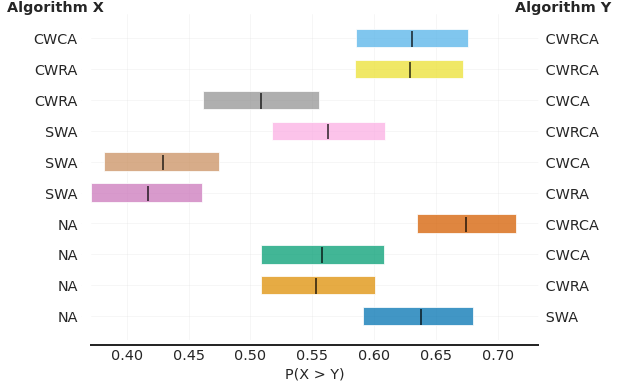

In [182]:
# use mean evals (bootstrap over runs only)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
task_bootstrap = False
reps = 1000 # setting reps=2000 took super long to get the plot
seed = None
figsize = (8, 6)
alpha = 0.75
interval_height = 0.6
wrect = 5
ticklabelsize = 'x-large'
labelsize = 'x-large'
ylabel_x_coordinate = 0.08
savefig = True
figname = "Probability of improvement (bootstrap over runs and use mean evals)"

plot_prob_of_improvement(hns_dicts, use_last=use_last, task_bootstrap=task_bootstrap, reps=reps, seed=seed, figsize=figsize, alpha=alpha, \
                         interval_height=interval_height, wrect=wrect, ticklabelsize=ticklabelsize, labelsize=labelsize, \
                         ylabel_x_coordinate=ylabel_x_coordinate, savefig=savefig, figname=figname)

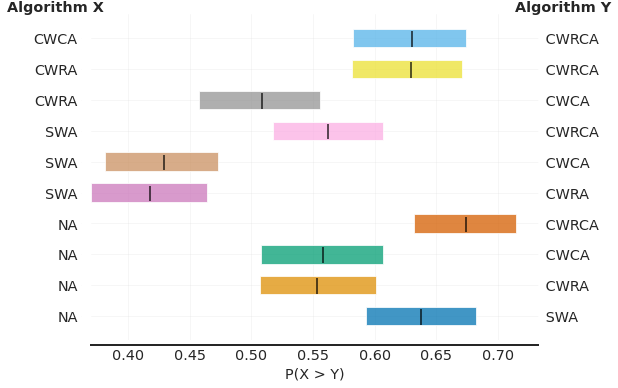

In [183]:
# use mean evals (bootstrap over runs and games)
hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
use_last = False
task_bootstrap = True
reps = 1000 # setting reps=2000 took super long to get the plot
seed = None
figsize = (8, 6)
alpha = 0.75
interval_height = 0.6
wrect = 5
ticklabelsize = 'x-large'
labelsize = 'x-large'
ylabel_x_coordinate = 0.08
savefig = True
figname = "Probability of improvement (bootstrap over runs & games and use mean evals)"

plot_prob_of_improvement(hns_dicts, use_last=use_last, task_bootstrap=task_bootstrap, reps=reps, seed=seed, figsize=figsize, alpha=alpha, \
                         interval_height=interval_height, wrect=wrect, ticklabelsize=ticklabelsize, labelsize=labelsize, \
                         ylabel_x_coordinate=ylabel_x_coordinate, savefig=savefig, figname=figname)

Use `mean evals`, `bootstrap over runs` and Set `algo_X`

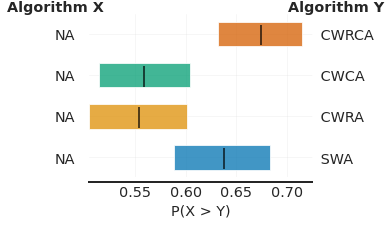

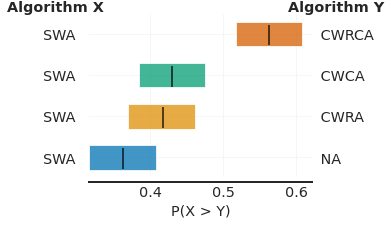

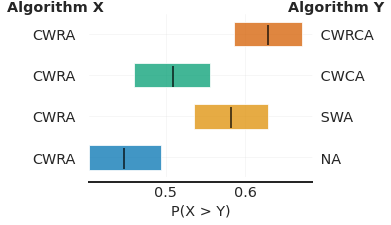

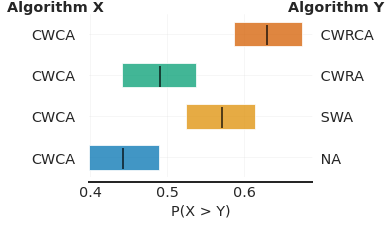

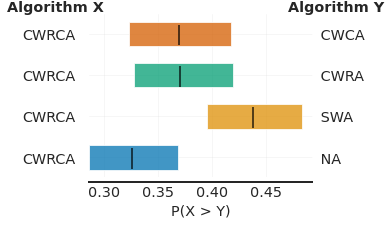

In [184]:
# use mean evals (bootstrap over runs only)
for sat in SELF_ATTN_TYPES.copy():
    hns_dicts = [last_eval_hns_dict_56, mean_eval_hns_dict_56]
    use_last = False
    task_bootstrap = False
    reps = 1000 # setting reps=2000 took super long to get the plot
    seed = None
    algo_X = sat
    figsize = (4, 3)
    alpha = 0.75
    interval_height = 0.6
    wrect = 5
    ticklabelsize = 'x-large'
    labelsize = 'x-large'
    ylabel_x_coordinate = 0.15
    savefig = True
    figname = f"Probability of improvement - {algo_X} vs rest (bootstrap over runs and use mean evals)"
    
    plot_prob_of_improvement(hns_dicts, use_last=use_last, task_bootstrap=task_bootstrap, reps=reps, seed=seed, algo_X=algo_X, \
                             figsize=figsize, alpha=alpha, interval_height=interval_height, wrect=wrect, ticklabelsize=ticklabelsize, \
                             labelsize=labelsize, ylabel_x_coordinate=ylabel_x_coordinate, savefig=savefig, figname=figname)

Sample efficiency

In [187]:
def plot_sample_efficiency(hns_dict: dict, results: dict, downsample_factor: int=5, ci_method: str='percentile', task_bootstrap: bool=False, \
                           reps: int=2000, ci_size: float=0.95, seed: int=None, figsize: Tuple[float, float]=None, \
                           ticklabelsize: str=None, labelsize: str=None, marker: str='o', linewidth: float=2, \
                           savefig: bool=True, figname: str=None) -> None:
    """
    plot IQM of HNS with CIs as a function of timesteps
    the HNS score array has a shape of (n_runs, n_games, n_eval) = (5, 56, 50)

    :param hns_dicts: the HNS dictionary based on 'all evals', i.e., the `all_eval_hns_dict_*`
    :param results: the post-processed results to extract the timesteps info to be used as the x-axis (in million scale)
    :param downsample_factor: the step size for downsampling the score array via slicing 
    :param ci_method: method for computing confidence interval, default as 'percentile'
    :param task_bootstrap: Whether to perform bootstrapping over tasks in addition to runs. Defaults to False.
    :param reps: number of bootstrap replications, default as 2000
    :param ci_size: the coverage of confidence interval, default as 0.95
    :param seed: to seed the Numpy RandomState for reproducible bootstrapping
    :param figsize: the size of the figure
    :param ticklabelsize: the size of the tick label
    :param labelsize: the size of the x and y labels
    :param marker: the type of marker, default as 'o'
    :param linewidth: the line width
    :param savefig: save the figure as a pdf file
    :parma figname: the name of the figure (to be used as the filename)
    :return: None
    """
    # get all algorithms to compare with
    algorithms = SELF_ATTN_TYPES.copy()
    
    assert hns_dict, f"'hns_dict' can not be empty!"
    # deepcopy and rename HNS score dict
    # we follow the variable naming used in 'plot_from_file.py'
    all_eval_normalized_scores_dict = deepcopy(hns_dict)
    assert len(all_eval_normalized_scores_dict[algorithms[0]].shape) == 3, f"the score array must have 3 dimensions!"

    assert results, f"'results' can not be empty!"
    results_ = deepcopy(results) # make a copy so that we do not change the original results
    # if 'results_table' is in results_, then delete it
    if 'results_table' in results_:
        del results_['results_table']
    # get N_GAMES
    N_GAMES = len(results_.keys())
    
    # get timesteps array
    timesteps = deepcopy(results_[next(iter(results_.keys()))][algorithms[0]][EVALUATION_TIMESTEP_KEY]) # EVALUATION_TIMESTEP_KEY = 'timesteps'
    # get the sizes of all dimensions
    n_runs, n_games, n_eval = all_eval_normalized_scores_dict[algorithms[0]].shape
    assert n_runs == len(SEEDS), f"score array should have {len(SEEDS)} runs!"
    assert n_games == N_GAMES, f"score array should have {N_GAMES} games!"
    assert n_eval == N_EVALUATION_CHECKPOINT, f"score array should have {N_EVALUATION_CHECKPOINT} evaluations!"
    # downsample (by slicing) the score array along the n_eval dimension
    # default downsample_factor = 5, after slicing, we will have 50/5=10 data points
    eval_indices = np.arange(n_eval - 1)[::downsample_factor]
    # add the index of the last eval checkpoint, now we have 10+1=11 data points: 0, 5, 10, ..., 45, 49
    eval_indices = np.concatenate((eval_indices, [n_eval - 1])) # len(eval_indices)=11
    # create the downsampled score dict
    eval_indices_scores_dict = {algorithm: score[:, :, eval_indices] for algorithm, score in all_eval_normalized_scores_dict.items()}
    # create the IQM aggregate metric lambda function which returns a 1-D array of len(eval_indices)=11
    # each element in the 1-D array is an IQM, calculated at that eval_idx
    iqm = lambda scores: np.array([metrics.aggregate_iqm(scores[..., eval_idx]) for eval_idx in range(scores.shape[-1])])
    # intialize a RandomState for reproducible bootstrapping
    rs = RandomState(seed) if seed is not None else None
    
    # compute IQM and CIs using the downsampled score dict
    # iqm_scores = a dict maps algorithms to IQMs
    # iqm_scores_cis = a dict maps algorithms to the 95% confidence intervals of IQMs
    iqm_scores, iqm_scores_cis = rly.get_interval_estimates(
        eval_indices_scores_dict, # the downsampled score dict, each score has a shape of (n_runs, n_games, len(eval_indices))
        iqm, # the lambda function
        method=ci_method, # one of 'basic', 'percentile', 'bc' and 'bca'
        task_bootstrap=task_bootstrap, # whether to bootstrap over tasks/games
        reps=reps,  # number of bootstrap replications
        confidence_interval_size=ci_size, # coverage of confidence interval
        random_state=rs, # RandomState to use to ensure reproducable results
    )
    # plot sample efficiency curves
    # get downsampled timesteps in Million scale
    timesteps_ds = [timesteps[eval_idx]/1e6 for eval_idx in eval_indices]
    plot_utils.plot_sample_efficiency_curve(
        timesteps_ds, # the x-axis
        iqm_scores, # the IQM scores at all eval_indices
        iqm_scores_cis, # the CIs of the IQM scores at all eval_indices
        algorithms=algorithms,
        colors=None, # Maps each algorithm pair id to a color. If None, then this mapping is created based on `color_palette`.
        color_palette='colorblind', # Name of palette for `seaborn.color_palette` object
        figsize=figsize, # the size of the figure passed to `matplotlib.subplots`. Only used when `ax` is None.
        xlabel=r"Timesteps (in Million)",
        ylabel="IQM Human Normalized Score",
        ax=None, # `matplotlib.axes` object (to plot on this ax)
        labelsize=labelsize, # the size of the x and y labels
        ticklabelsize=ticklabelsize, # the size of the tick label
        marker=marker, # the marker of the plot
        linewidth=linewidth, # the line width
    )
    plt.gcf().canvas.manager.set_window_title("Sample Efficiency Curve")
    plt.legend()
    # plt.tight_layout() # use bbox_inches='tight' instead
    if savefig:
        figure_fp = os.path.join(FIGURE_PATH_EVALUATION, RLIABLE_PATH)
        figure_fn = figname + FIGURE_EXT
        plt.savefig(os.path.join(figure_fp, figure_fn), dpi=DPI, bbox_inches='tight')

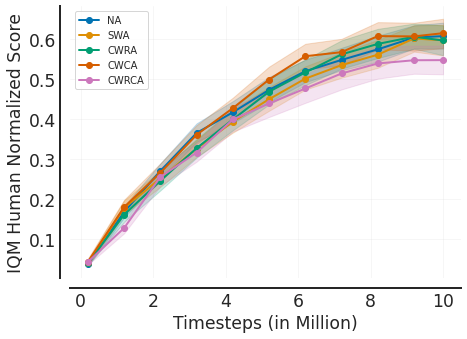

In [188]:
# bootstrap over runs only
hns_dict = all_eval_hns_dict_56
results = post_processed_results_56
downsample_factor = 5
task_bootstrap = False
reps = 2000
seed = None
figsize=(7,5)
labelsize='xx-large'
ticklabelsize='xx-large'
marker = 'o'
linewidth = 2
savefig = True
figname = "Sample efficiency (bootstrap over runs)"

plot_sample_efficiency(hns_dict, results, downsample_factor=downsample_factor, task_bootstrap=task_bootstrap, \
                       reps=reps, seed=seed, figsize=figsize, ticklabelsize=ticklabelsize, labelsize=labelsize, \
                       marker=marker, linewidth=linewidth, savefig=savefig, figname=figname)

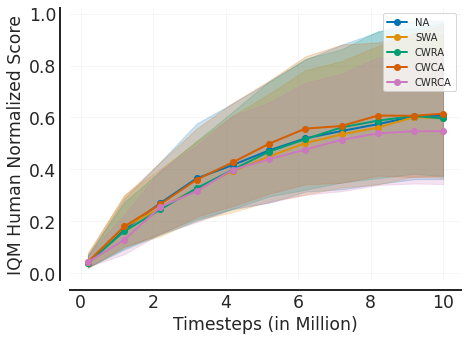

In [189]:
# bootstrap over runs and games
hns_dict = all_eval_hns_dict_56
results = post_processed_results_56
downsample_factor = 5
task_bootstrap = True
reps = 2000
seed = None
figsize=(7,5)
labelsize='xx-large'
ticklabelsize='xx-large'
marker = 'o'
linewidth = 2
savefig = True
figname = "Sample efficiency (bootstrap over runs & games)"

plot_sample_efficiency(hns_dict, results, downsample_factor=downsample_factor, task_bootstrap=task_bootstrap, \
                       reps=reps, seed=seed, figsize=figsize, ticklabelsize=ticklabelsize, labelsize=labelsize, \
                       marker=marker, linewidth=linewidth, savefig=savefig, figname=figname)